# Bayesian filtering: tracking multiple sensors using radio pings

Load the libraries we need

In [1]:
import math
import time
import sys
import numpy as np
from scipy import misc
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib import patches

## Create the data structures

Define the state variables $\mathbf{X}$ and the sensor variables $\mathbf{Y}$. In this case, the state variables consist of the positions of the different sensors in two dimensions (denoted $h$ and $v$ to avoid confusion with $\mathbf{X}$ and $\mathbf{Y}$). There are moving sensors, which start out at a random spot in the room and then execute a random walk, and stationary sensors, which start out near pre-defined guesses and then jitter their locations while remaining near these guesses (we have artifically added this jitter for technical reasons to help the particle filter converge). The sensor variables are the pairwise distances between the sensors (moving and stationary) and the distance from the sensors to a set of fixed sensors (whose positions are _not_ part of the state of the system).

Define the number of each type of sensor and the number of fixed sensors.

In [2]:
num_moving_sensors = 3
num_stationary_sensors = 4 # Currently must be 4 or fewer because we manually place them from a fixed list of 4 positions

Define the names for the sensors.

In [3]:
sensor_names = []
sensor_names_long = []

for moving_sensor_index in range(num_moving_sensors):
    sensor_names.append('mov_{:02d}'.format(moving_sensor_index + 1))
    sensor_names_long.append('Moving sensor {}'.format(moving_sensor_index + 1))

for stationary_sensor_index in range(num_stationary_sensors):
    sensor_names.append('sta_{:02d}'.format(stationary_sensor_index + 1))
    sensor_names_long.append('Stationary sensor {}'.format(stationary_sensor_index + 1))

num_sensors = len(sensor_names)

Working from the sensor names, define the names of the $\mathbf{X}$ variables (the state variables).

In [4]:
dimension_names = [
    'h',
    'v'
]

dimension_names_long = [
    '$h$',
    '$v$'
]

num_dimensions = len(dimension_names)

In [5]:
x_names = []
x_names_long = []

for sensor_index in range(num_sensors):
    for dimension_index in range(num_dimensions):
        x_names.append('{}_pos_{}'.format(sensor_names[sensor_index],
                                          dimension_names[dimension_index]))
        x_names_long.append('{} {} position'.format(sensor_names_long[sensor_index],
                                                    dimension_names_long[dimension_index]))

Using the sensor names above and the names of the fixed sensors, generate the names of the $\mathbf{Y}$ variables (the sensor variables).

In [6]:
y_discrete_names = []
y_discrete_names_long = []

y_continuous_names = []
y_continuous_names_long = []

for sending_sensor_index in range(num_sensors):
    receiving_sensor_range = range(num_sensors)
    del receiving_sensor_range[sending_sensor_index]
    for receiving_sensor_index in receiving_sensor_range:
        y_discrete_names.append('{}_{}_ping_status'.format(sensor_names[sending_sensor_index],
                                                      sensor_names[receiving_sensor_index]))
        y_discrete_names_long.append('Status of ping from {} to {}'.format(sensor_names_long[sending_sensor_index],
                                                                           sensor_names_long[receiving_sensor_index]))        
        y_continuous_names.append('{}_{}_rssi'.format(sensor_names[sending_sensor_index],
                                                      sensor_names[receiving_sensor_index]))
        y_continuous_names_long.append('RSSI of ping from {} to {}'.format(sensor_names_long[sending_sensor_index],
                                                                           sensor_names_long[receiving_sensor_index]))        

In [7]:
ping_status_names = [
    'rec',
    'notrec'
]

ping_status_names_long = [
    'Received',
    'Not received'
]

Define constants for the number of $\mathbf{X}$ variables and the number of $\mathbf{Y}$ variables.

In [8]:
num_x_vars = len(x_names)
num_y_discrete_vars = len(y_discrete_names)
num_y_continuous_vars = len(y_continuous_names)

num_ping_statuses = len(ping_status_names)

Print out all of these variables to make sure they are what we expect.

In [9]:
x_names

['mov_01_pos_h',
 'mov_01_pos_v',
 'mov_02_pos_h',
 'mov_02_pos_v',
 'mov_03_pos_h',
 'mov_03_pos_v',
 'sta_01_pos_h',
 'sta_01_pos_v',
 'sta_02_pos_h',
 'sta_02_pos_v',
 'sta_03_pos_h',
 'sta_03_pos_v',
 'sta_04_pos_h',
 'sta_04_pos_v']

In [10]:
x_names_long

['Moving sensor 1 $h$ position',
 'Moving sensor 1 $v$ position',
 'Moving sensor 2 $h$ position',
 'Moving sensor 2 $v$ position',
 'Moving sensor 3 $h$ position',
 'Moving sensor 3 $v$ position',
 'Stationary sensor 1 $h$ position',
 'Stationary sensor 1 $v$ position',
 'Stationary sensor 2 $h$ position',
 'Stationary sensor 2 $v$ position',
 'Stationary sensor 3 $h$ position',
 'Stationary sensor 3 $v$ position',
 'Stationary sensor 4 $h$ position',
 'Stationary sensor 4 $v$ position']

In [11]:
y_discrete_names

['mov_01_mov_02_ping_status',
 'mov_01_mov_03_ping_status',
 'mov_01_sta_01_ping_status',
 'mov_01_sta_02_ping_status',
 'mov_01_sta_03_ping_status',
 'mov_01_sta_04_ping_status',
 'mov_02_mov_01_ping_status',
 'mov_02_mov_03_ping_status',
 'mov_02_sta_01_ping_status',
 'mov_02_sta_02_ping_status',
 'mov_02_sta_03_ping_status',
 'mov_02_sta_04_ping_status',
 'mov_03_mov_01_ping_status',
 'mov_03_mov_02_ping_status',
 'mov_03_sta_01_ping_status',
 'mov_03_sta_02_ping_status',
 'mov_03_sta_03_ping_status',
 'mov_03_sta_04_ping_status',
 'sta_01_mov_01_ping_status',
 'sta_01_mov_02_ping_status',
 'sta_01_mov_03_ping_status',
 'sta_01_sta_02_ping_status',
 'sta_01_sta_03_ping_status',
 'sta_01_sta_04_ping_status',
 'sta_02_mov_01_ping_status',
 'sta_02_mov_02_ping_status',
 'sta_02_mov_03_ping_status',
 'sta_02_sta_01_ping_status',
 'sta_02_sta_03_ping_status',
 'sta_02_sta_04_ping_status',
 'sta_03_mov_01_ping_status',
 'sta_03_mov_02_ping_status',
 'sta_03_mov_03_ping_status',
 'sta_03_s

In [12]:
y_discrete_names_long

['Status of ping from Moving sensor 1 to Moving sensor 2',
 'Status of ping from Moving sensor 1 to Moving sensor 3',
 'Status of ping from Moving sensor 1 to Stationary sensor 1',
 'Status of ping from Moving sensor 1 to Stationary sensor 2',
 'Status of ping from Moving sensor 1 to Stationary sensor 3',
 'Status of ping from Moving sensor 1 to Stationary sensor 4',
 'Status of ping from Moving sensor 2 to Moving sensor 1',
 'Status of ping from Moving sensor 2 to Moving sensor 3',
 'Status of ping from Moving sensor 2 to Stationary sensor 1',
 'Status of ping from Moving sensor 2 to Stationary sensor 2',
 'Status of ping from Moving sensor 2 to Stationary sensor 3',
 'Status of ping from Moving sensor 2 to Stationary sensor 4',
 'Status of ping from Moving sensor 3 to Moving sensor 1',
 'Status of ping from Moving sensor 3 to Moving sensor 2',
 'Status of ping from Moving sensor 3 to Stationary sensor 1',
 'Status of ping from Moving sensor 3 to Stationary sensor 2',
 'Status of ping

In [13]:
y_continuous_names

['mov_01_mov_02_rssi',
 'mov_01_mov_03_rssi',
 'mov_01_sta_01_rssi',
 'mov_01_sta_02_rssi',
 'mov_01_sta_03_rssi',
 'mov_01_sta_04_rssi',
 'mov_02_mov_01_rssi',
 'mov_02_mov_03_rssi',
 'mov_02_sta_01_rssi',
 'mov_02_sta_02_rssi',
 'mov_02_sta_03_rssi',
 'mov_02_sta_04_rssi',
 'mov_03_mov_01_rssi',
 'mov_03_mov_02_rssi',
 'mov_03_sta_01_rssi',
 'mov_03_sta_02_rssi',
 'mov_03_sta_03_rssi',
 'mov_03_sta_04_rssi',
 'sta_01_mov_01_rssi',
 'sta_01_mov_02_rssi',
 'sta_01_mov_03_rssi',
 'sta_01_sta_02_rssi',
 'sta_01_sta_03_rssi',
 'sta_01_sta_04_rssi',
 'sta_02_mov_01_rssi',
 'sta_02_mov_02_rssi',
 'sta_02_mov_03_rssi',
 'sta_02_sta_01_rssi',
 'sta_02_sta_03_rssi',
 'sta_02_sta_04_rssi',
 'sta_03_mov_01_rssi',
 'sta_03_mov_02_rssi',
 'sta_03_mov_03_rssi',
 'sta_03_sta_01_rssi',
 'sta_03_sta_02_rssi',
 'sta_03_sta_04_rssi',
 'sta_04_mov_01_rssi',
 'sta_04_mov_02_rssi',
 'sta_04_mov_03_rssi',
 'sta_04_sta_01_rssi',
 'sta_04_sta_02_rssi',
 'sta_04_sta_03_rssi']

In [14]:
y_continuous_names_long

['RSSI of ping from Moving sensor 1 to Moving sensor 2',
 'RSSI of ping from Moving sensor 1 to Moving sensor 3',
 'RSSI of ping from Moving sensor 1 to Stationary sensor 1',
 'RSSI of ping from Moving sensor 1 to Stationary sensor 2',
 'RSSI of ping from Moving sensor 1 to Stationary sensor 3',
 'RSSI of ping from Moving sensor 1 to Stationary sensor 4',
 'RSSI of ping from Moving sensor 2 to Moving sensor 1',
 'RSSI of ping from Moving sensor 2 to Moving sensor 3',
 'RSSI of ping from Moving sensor 2 to Stationary sensor 1',
 'RSSI of ping from Moving sensor 2 to Stationary sensor 2',
 'RSSI of ping from Moving sensor 2 to Stationary sensor 3',
 'RSSI of ping from Moving sensor 2 to Stationary sensor 4',
 'RSSI of ping from Moving sensor 3 to Moving sensor 1',
 'RSSI of ping from Moving sensor 3 to Moving sensor 2',
 'RSSI of ping from Moving sensor 3 to Stationary sensor 1',
 'RSSI of ping from Moving sensor 3 to Stationary sensor 2',
 'RSSI of ping from Moving sensor 3 to Stationar

In [15]:
num_x_vars

14

In [16]:
num_y_discrete_vars

42

In [17]:
num_y_continuous_vars

42

In [18]:
num_ping_statuses

2

## Create the probability models

The particle filter takes three probability models as inputs: the initial state model $f(\mathbf{X}_0)$, the transition model $f(\mathbf{X}_t | \mathbf{X}_{t-1})$, and the sensor response model $f(\mathbf{Y} | \mathbf{X})$. In this case, we define the room as a rectangle which is 2 units wide and 1 unit high. The initial positions of the moving sensors are distributed uniformly within the room. The initial positions of the stationary sensors are placed near defined guesses with Gaussian error $\sigma_s = 0.1$. The transition model for the moving sensors is a two-dimensional random walk for each sensor with a standard deviation of $\sigma_d = 0.1$. The transition model for the stationary sensors is a blend between their initial positions and a random walk with Gaussian jitter $\sigma_j = 0.1$ (we artifically introduce this slight jitter to help the particle filter converge). The sensor response model is that the sensors measure the pairwise distances between the sensors and the distances from the sensors to the fixed sensors with Gaussian error $\sigma_m = 0.2$.

### Initial state model

Define a function that generates samples of the initial state $\mathbf{X}_0$. We'll need this both to generate our simulated data and as an input to the particle filter. Moving sensors are distributed uniformly throughout the room and the positions of the stationary sensors are sampled from a 2-d Gaussian distribution centered on their guesses. We include some additional machinery to allow for the possibility of no moving sensors or no stationary sensors.

In [19]:
room_size = np.array([20.0, 10.0])

In [20]:
stationary_sensor_position_guesses = np.array([
    [room_size[0]/2, room_size[1]],
    [room_size[0]/2, 0.0],
    [0.0, room_size[1]/2],
    [room_size[0], room_size[1]/2]
])[0:num_stationary_sensors]

In [21]:
stationary_sensor_position_guesses_fast = room_size*np.array([[0.5, 1.0],
                                                              [0.5, 0.0],
                                                              [0.0, 0.5],
                                                              [1.0, 0.5]])[0:num_stationary_sensors]

In [22]:
stationary_sensor_position_guesses

array([[ 10.,  10.],
       [ 10.,   0.],
       [  0.,   5.],
       [ 20.,   5.]])

In [23]:
stationary_sensor_position_guesses_fast

array([[ 10.,  10.],
       [ 10.,   0.],
       [  0.,   5.],
       [ 20.,   5.]])

In [24]:
stationary_sensor_position_guess_error = 2.0

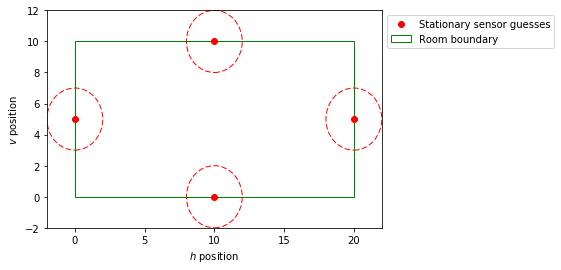

In [25]:
plt.plot(stationary_sensor_position_guesses[:,0],
         stationary_sensor_position_guesses[:,1],
         'ro',
        label='Stationary sensor guesses')
ax = plt.gca()
for stationary_sensor_index in range(num_stationary_sensors):
    ax.add_patch(patches.Ellipse((stationary_sensor_position_guesses[stationary_sensor_index,0],
                                  stationary_sensor_position_guesses[stationary_sensor_index,1]),
                                 width=stationary_sensor_position_guess_error*2,
                                 height=stationary_sensor_position_guess_error*2,
                                 fill=False,
                                 linestyle='dashed',
                                 color='red'))
ax.add_patch(patches.Rectangle((0,0),
                               room_size[0],
                               room_size[1],
                               fill=False,
                               color='green',
                               label='Room boundary'))
plt.xlabel('{} position'.format(dimension_names_long[0]))
plt.ylabel('{} position'.format(dimension_names_long[1]))
plt.xlim(0 - stationary_sensor_position_guess_error,
         room_size[0] + stationary_sensor_position_guess_error)
plt.ylim(0 - stationary_sensor_position_guess_error,
         room_size[1] + stationary_sensor_position_guess_error)
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

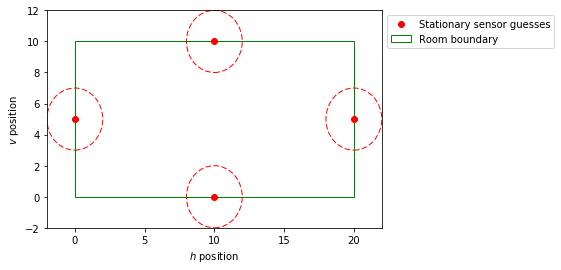

In [26]:
plt.plot(stationary_sensor_position_guesses_fast[:,0],
         stationary_sensor_position_guesses_fast[:,1],
         'ro',
        label='Stationary sensor guesses')
ax = plt.gca()
for stationary_sensor_index in range(num_stationary_sensors):
    ax.add_patch(patches.Ellipse((stationary_sensor_position_guesses_fast[stationary_sensor_index,0],
                                  stationary_sensor_position_guesses_fast[stationary_sensor_index,1]),
                                 width=stationary_sensor_position_guess_error*2,
                                 height=stationary_sensor_position_guess_error*2,
                                 fill=False,
                                 linestyle='dashed',
                                 color='red'))
ax.add_patch(patches.Rectangle((0,0),
                               room_size[0],
                               room_size[1],
                               fill=False,
                               color='green',
                               label='Room boundary'))
plt.xlabel('{} position'.format(dimension_names_long[0]))
plt.ylabel('{} position'.format(dimension_names_long[1]))
plt.xlim(0 - stationary_sensor_position_guess_error,
         room_size[0] + stationary_sensor_position_guess_error)
plt.ylim(0 - stationary_sensor_position_guess_error,
         room_size[1] + stationary_sensor_position_guess_error)
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

In [27]:
def x_initial_sample():
    if num_moving_sensors > 0:
        moving_sensors = np.random.uniform(high=np.tile(room_size,
                                                        num_moving_sensors))
    else:
        moving_sensors = np.array([])
    if num_stationary_sensors > 0:
        stationary_sensors = np.random.multivariate_normal(stationary_sensor_position_guesses.flatten(),
                                                           np.diagflat(np.repeat(stationary_sensor_position_guess_error**2,
                                                                                 num_stationary_sensors*num_dimensions)))
    else:
        stationary_sensors = np.array([])
    return np.concatenate((moving_sensors, stationary_sensors))

In [28]:
def x_initial_sample_fast():
    if num_moving_sensors > 0:
        moving_sensors = np.random.uniform(high=np.tile(room_size,
                                                        num_moving_sensors))
    else:
        moving_sensors = np.array([])
    if num_stationary_sensors > 0:
        stationary_sensors = np.random.multivariate_normal(stationary_sensor_position_guesses_fast.flatten(),
                                                           np.diagflat(np.repeat(stationary_sensor_position_guess_error**2,
                                                                                 num_stationary_sensors*num_dimensions)))
    else:
        stationary_sensors = np.array([])
    return np.concatenate((moving_sensors, stationary_sensors))

Generate 1,000 samples and check that they have the properties we expect.

In [29]:
time_start = time.clock()
x_initial_samples = np.array([x_initial_sample() for i in range(1000)])
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 0.26918004515


In [30]:
time_start = time.clock()
x_initial_samples_fast = np.array([x_initial_sample_fast() for i in range(1000)])
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 0.24982133341


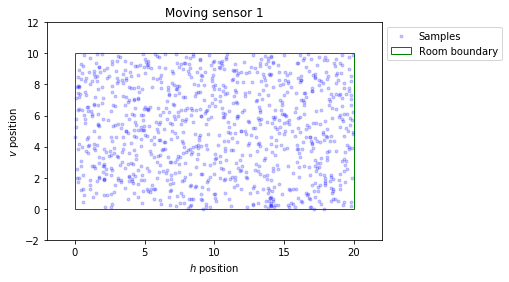

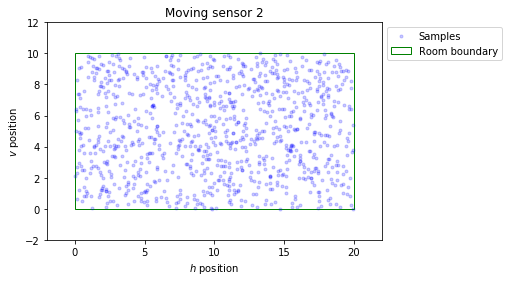

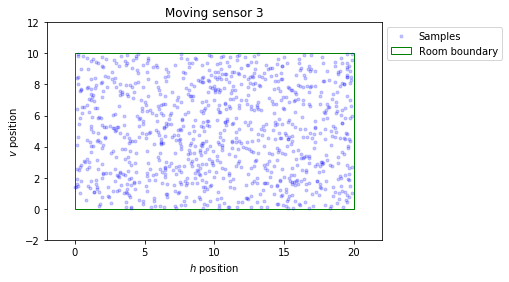

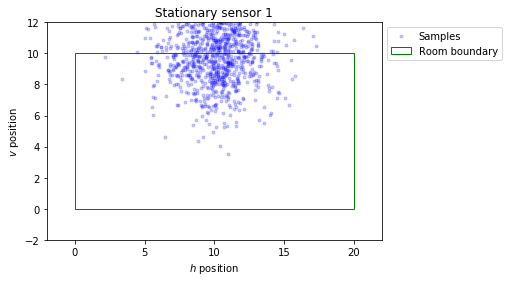

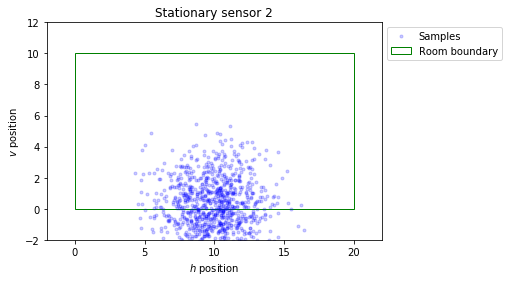

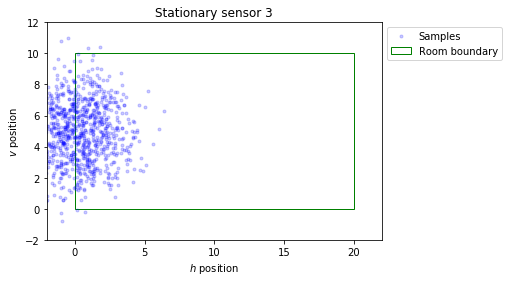

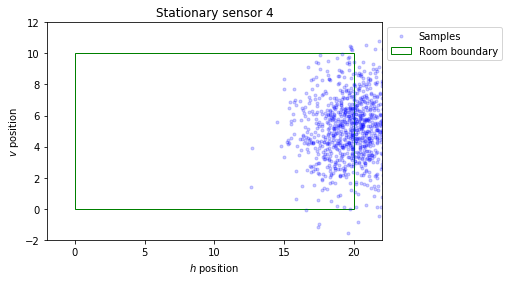

In [31]:
for sensor_index in range(num_sensors):
    plt.plot(x_initial_samples[:,sensor_index*2],
             x_initial_samples[:,sensor_index*2 + 1],
             'b.',
             alpha = 0.2,
             label="Samples")
    plt.title(sensor_names_long[sensor_index])
    plt.xlabel('{} position'.format(dimension_names_long[0]))
    plt.ylabel('{} position'.format(dimension_names_long[1]))
    ax=plt.gca()
    ax.add_patch(patches.Rectangle((0,0),
                                   room_size[0],
                                   room_size[1],
                                   fill=False,
                                   color='green',
                                   label='Room boundary'))
    plt.xlim(0 - stationary_sensor_position_guess_error,
             room_size[0] + stationary_sensor_position_guess_error)
    plt.ylim(0 - stationary_sensor_position_guess_error,
             room_size[1] + stationary_sensor_position_guess_error)
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

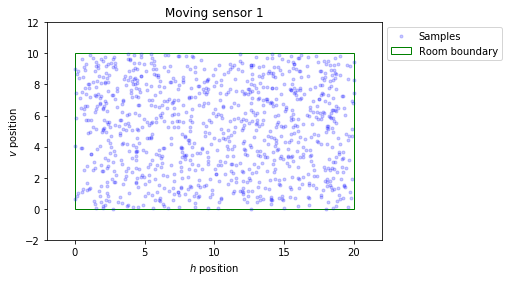

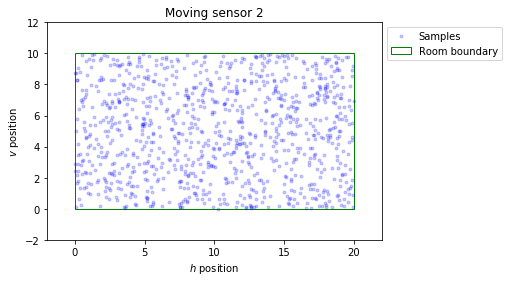

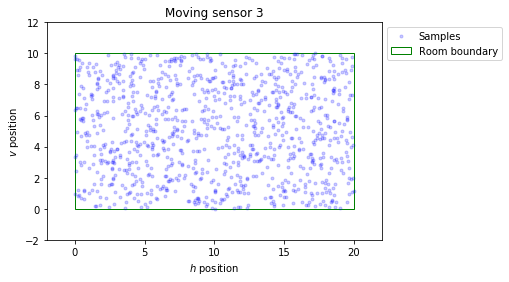

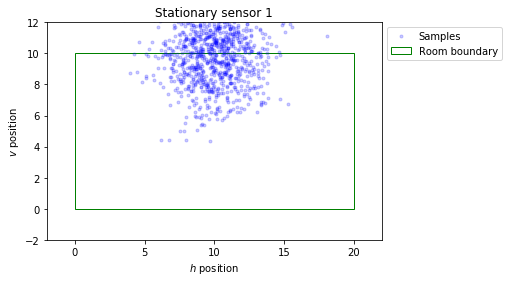

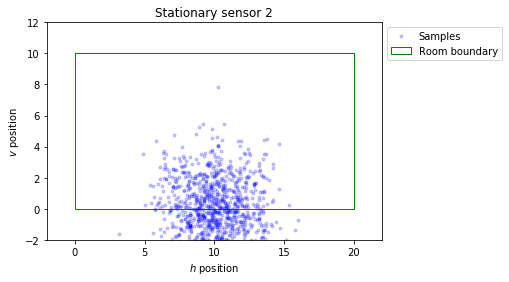

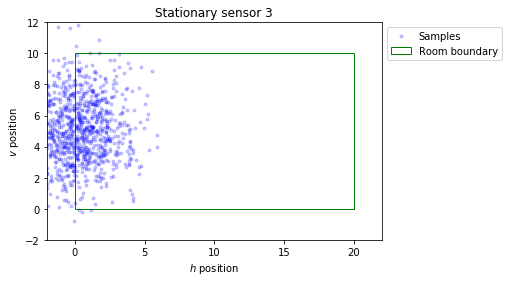

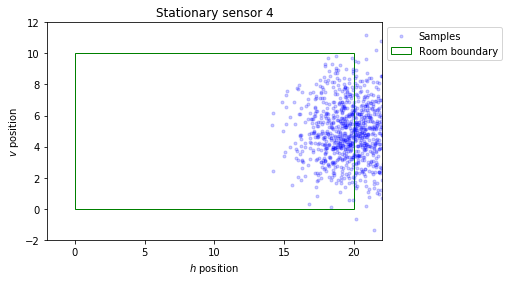

In [32]:
for sensor_index in range(num_sensors):
    plt.plot(x_initial_samples_fast[:,sensor_index*2],
             x_initial_samples_fast[:,sensor_index*2 + 1],
             'b.',
             alpha = 0.2,
             label="Samples")
    plt.title(sensor_names_long[sensor_index])
    plt.xlabel('{} position'.format(dimension_names_long[0]))
    plt.ylabel('{} position'.format(dimension_names_long[1]))
    ax=plt.gca()
    ax.add_patch(patches.Rectangle((0,0),
                                   room_size[0],
                                   room_size[1],
                                   fill=False,
                                   color='green',
                                   label='Room boundary'))
    plt.xlim(0 - stationary_sensor_position_guess_error,
             room_size[0] + stationary_sensor_position_guess_error)
    plt.ylim(0 - stationary_sensor_position_guess_error,
             room_size[1] + stationary_sensor_position_guess_error)
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

Calculate the sample means of the initial positions.

In [33]:
np.mean(x_initial_samples, 0)

array([  9.99123811,   5.10730828,  10.04093599,   5.08234566,
        10.15705582,   4.94982636,  10.05904598,  10.06510861,
         9.95923272,  -0.02256433,   0.04337889,   4.95397563,
        20.02943077,   5.09404119])

In [34]:
np.mean(x_initial_samples_fast, 0)

array([ 10.07669876,   5.15560823,  10.14929501,   5.00702717,
         9.99059308,   5.09541014,   9.91033304,  10.01874524,
        10.01969149,  -0.04403092,   0.13093524,   5.06579367,
        20.01684153,   4.97300952])

Compare with the known means of the distributions the samples were drawn from (noting that the mean of the uniform distribution from zero to $a$ is $\frac{a}{2}$).

In [35]:
np.concatenate((np.tile(room_size/2, num_moving_sensors),
                stationary_sensor_position_guesses.flatten()))

array([ 10.,   5.,  10.,   5.,  10.,   5.,  10.,  10.,  10.,   0.,   0.,
         5.,  20.,   5.])

Calculate the sample standard deviations of the initial positions.

In [36]:
np.std(x_initial_samples, 0)

array([ 5.79496976,  2.89056125,  5.62903324,  2.85456365,  5.69542756,
        2.88294875,  2.05257441,  1.99801061,  2.02708847,  1.94254806,
        2.01576829,  1.96100565,  1.98005721,  2.05665926])

In [37]:
np.std(x_initial_samples_fast, 0)

array([ 5.75715258,  2.85263743,  5.83206524,  2.91755963,  5.77273858,
        2.89889302,  1.96265896,  1.94373761,  1.9640337 ,  1.9764809 ,
        1.99157464,  2.09008722,  2.01718364,  1.92609425])

Compare with the known standard deviations of the distribution that the samples were drawn from (noting that the standard deviation of the uniform distribution over an interval of size $a$ is $\frac{a}{\sqrt{12}}$).

In [38]:
np.concatenate((np.tile(room_size/math.sqrt(12), num_moving_sensors),
                np.repeat(stationary_sensor_position_guess_error, num_stationary_sensors*2)))

array([ 5.77350269,  2.88675135,  5.77350269,  2.88675135,  5.77350269,
        2.88675135,  2.        ,  2.        ,  2.        ,  2.        ,
        2.        ,  2.        ,  2.        ,  2.        ])

### Transition model

Define a function that generates samples of the state $\mathbf{X}_t$ given $\mathbf{X}_{t-1}$. We'll use this both to generate our simulated data and as an input to the particle filter. Moving sensors execute a simple 2-d random walk. Stationary sensors generate two samples, one from their initial position distribution and one from a Gaussian centered on their last position, and then average these samples. The latter is a hack to introduce some jitter to the positions of the stationary sensors while ensuring that they remain near their guesses. This jitter helps the particle filter converge.

In [39]:
moving_sensor_drift = 0.5
stationary_sensor_drift = 0.25

In [40]:
def x_bar_x_prev_sample(x_prev):
    if num_moving_sensors > 0:
        moving_sensor_positions = np.random.multivariate_normal(x_prev[:num_moving_sensors*2],
                                                                np.diagflat(np.repeat(moving_sensor_drift**2,
                                                                                      num_moving_sensors*num_dimensions)))
    else:
        moving_sensor_positions = np.array([])
    if num_stationary_sensors > 0:
        position_guesses = np.random.multivariate_normal(stationary_sensor_position_guesses_fast.flatten(),
                                                         np.diagflat(np.repeat(stationary_sensor_position_guess_error**2,
                                                                               num_stationary_sensors*num_dimensions)))
        drifted_positions = np.random.multivariate_normal(x_prev[num_moving_sensors*2:],
                                                          np.diagflat(np.repeat(stationary_sensor_drift**2,
                                                                                num_stationary_sensors*num_dimensions)))
        stationary_sensor_positions = (position_guesses + drifted_positions)/2
    else:
        stationary_sensor_positions = np.array([])
    return np.concatenate((moving_sensor_positions, stationary_sensor_positions))

In [41]:
def x_bar_x_prev_sample_fast(x_prev):
    if num_moving_sensors > 0:
        moving_sensor_positions = np.random.multivariate_normal(x_prev[:num_moving_sensors*2],
                                                                np.diagflat(np.repeat(moving_sensor_drift**2,
                                                                                      num_moving_sensors*num_dimensions)))
    else:
        moving_sensor_positions = np.array([])
    if num_stationary_sensors > 0:
        position_guesses = np.random.multivariate_normal(stationary_sensor_position_guesses_fast.flatten(),
                                                         np.diagflat(np.repeat(stationary_sensor_position_guess_error**2,
                                                                               num_stationary_sensors*num_dimensions)))
        drifted_positions = np.random.multivariate_normal(x_prev[num_moving_sensors*2:],
                                                          np.diagflat(np.repeat(stationary_sensor_drift**2,
                                                                                num_stationary_sensors*num_dimensions)))
        stationary_sensor_positions = (position_guesses + drifted_positions)/2
    else:
        stationary_sensor_positions = np.array([])
    return np.concatenate((moving_sensor_positions, stationary_sensor_positions))

Choose an arbitrary test value for $\mathbf{X}$, drawn from the initial distribution, that we can use to test the various functions.

In [42]:
test_x_value = x_initial_sample()

In [43]:
test_x_value

array([ 18.63298913,   2.95933143,  17.62132181,   6.85756793,
        10.90766176,   9.87915305,   8.66164174,   6.53010811,
         9.65884279,  -3.30615906,   2.51347494,   6.49865148,
        16.93153893,   5.56936388])

Generate 1,000 samples (using our test value for $\mathbf{X}_{t-1}$) to make sure they have the properties we expect.

In [44]:
time_start = time.clock()
x_bar_x_prev_samples = np.array([x_bar_x_prev_sample(test_x_value) for i in range(1000)])
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 0.574325514954


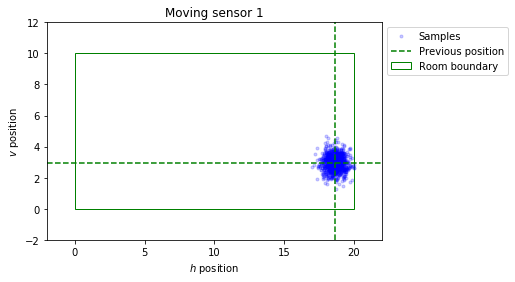

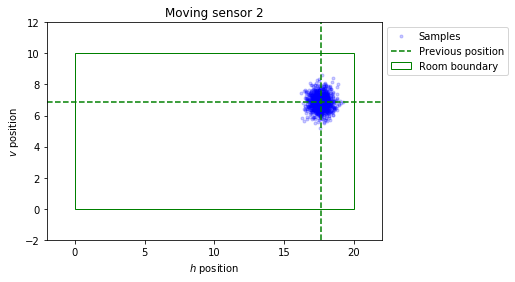

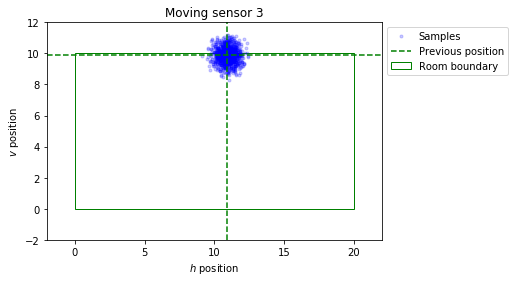

In [45]:
for sensor_index in range(num_moving_sensors):
    plt.plot(x_bar_x_prev_samples[:,sensor_index*2],
             x_bar_x_prev_samples[:,sensor_index*2 + 1],
             'b.',
             alpha=0.2,
            label='Samples')
    plt.title(sensor_names_long[sensor_index])
    plt.xlabel('{} position'.format(dimension_names_long[0]))
    plt.ylabel('{} position'.format(dimension_names_long[1]))
    plt.axvline(x=test_x_value[sensor_index*2],
                linestyle='dashed',
                color='green',
                label='Previous position')
    plt.axhline(y=test_x_value[sensor_index*2 + 1], linestyle='dashed', color='green')
    ax=plt.gca()
    ax.add_patch(patches.Rectangle((0,0),
                                   room_size[0],
                                   room_size[1],
                                   fill=False,
                                   color='green',
                                   label='Room boundary'))
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.xlim(0 - stationary_sensor_position_guess_error,
             room_size[0] + stationary_sensor_position_guess_error)
    plt.ylim(0 - stationary_sensor_position_guess_error,
             room_size[1] + stationary_sensor_position_guess_error)
    plt.show()

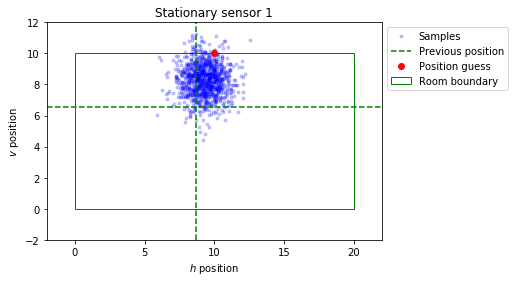

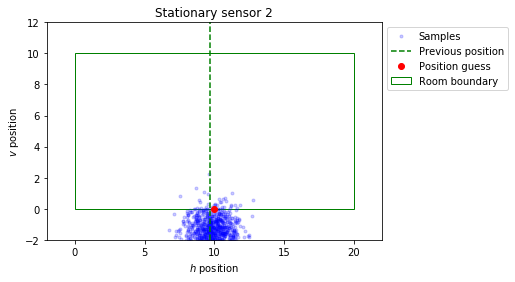

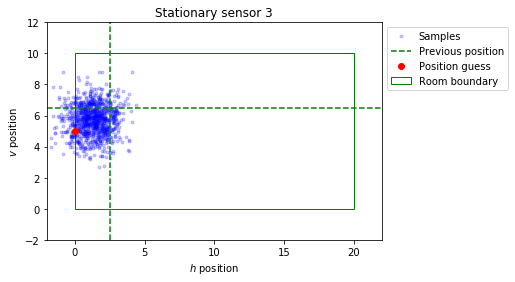

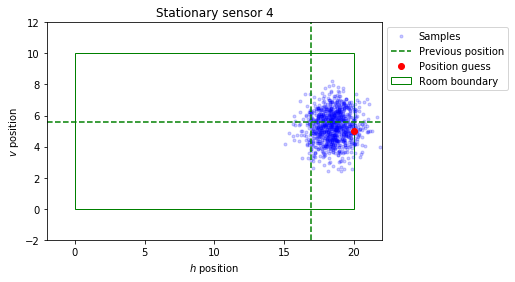

In [46]:
for sensor_index in range(num_moving_sensors, num_sensors):
    plt.plot(x_bar_x_prev_samples[:,sensor_index*2],
             x_bar_x_prev_samples[:,sensor_index*2 + 1],
             'b.',
             alpha=0.2,
             label='Samples')
    plt.title(sensor_names_long[sensor_index])
    plt.xlabel('{} position'.format(dimension_names_long[0]))
    plt.ylabel('{} position'.format(dimension_names_long[1]))
    plt.axvline(x=test_x_value[sensor_index*2], linestyle='dashed', color='green', label='Previous position')
    plt.axhline(y=test_x_value[sensor_index*2 + 1], linestyle='dashed', color='green')
    plt.plot(stationary_sensor_position_guesses[sensor_index-num_moving_sensors][0],
            stationary_sensor_position_guesses[sensor_index-num_moving_sensors][1],
            'ro',
            label = 'Position guess')
    ax=plt.gca()
    ax.add_patch(patches.Rectangle((0,0),
                                   room_size[0],
                                   room_size[1],
                                   fill=False,
                                   color='green',
                                   label='Room boundary'))
    plt.xlim(0 - stationary_sensor_position_guess_error,
             room_size[0] + stationary_sensor_position_guess_error)
    plt.ylim(0 - stationary_sensor_position_guess_error,
             room_size[1] + stationary_sensor_position_guess_error)
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

### Sensor response model

#### Produce samples of $\mathbf{Y}$ given $\mathbf{X}$

Define a function that returns the distances between the different sensors (in the same order as `y_names` above) given $\mathbf{X}$.

In [47]:
def distances(x):
    return np.delete(np.linalg.norm(np.subtract(np.tile(x.reshape((num_sensors, num_dimensions)),
                                                        (num_sensors,1)),
                                                np.repeat(x.reshape((num_sensors, num_dimensions)),
                                                          num_sensors,
                                                          axis=0)),
                                    axis=1),
                     np.arange(num_sensors)*num_sensors + np.arange(num_sensors))    

In [48]:
def distances_fast(x):
    if x.ndim == 1:
        x = np.expand_dims(x, 0)
    num_x_values = x.shape[0]
    return np.squeeze(np.delete(np.linalg.norm(np.subtract(np.tile(x.reshape((num_x_values, num_sensors, num_dimensions)),
                                                                   (1, num_sensors, 1)),
                                                           np.repeat(x.reshape((num_x_values, num_sensors, num_dimensions)),
                                                                     num_sensors,
                                                                     axis = 1)),
                                               axis=2),
                                np.arange(num_sensors)*num_sensors + np.arange(num_sensors),1))

In [49]:
distances(np.array([1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0]))

array([ 1.41421356,  2.82842712,  4.24264069,  5.65685425,  7.07106781,
        8.48528137,  1.41421356,  1.41421356,  2.82842712,  4.24264069,
        5.65685425,  7.07106781,  2.82842712,  1.41421356,  1.41421356,
        2.82842712,  4.24264069,  5.65685425,  4.24264069,  2.82842712,
        1.41421356,  1.41421356,  2.82842712,  4.24264069,  5.65685425,
        4.24264069,  2.82842712,  1.41421356,  1.41421356,  2.82842712,
        7.07106781,  5.65685425,  4.24264069,  2.82842712,  1.41421356,
        1.41421356,  8.48528137,  7.07106781,  5.65685425,  4.24264069,
        2.82842712,  1.41421356])

In [50]:
distances_fast(np.array([1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0]))

array([ 1.41421356,  2.82842712,  4.24264069,  5.65685425,  7.07106781,
        8.48528137,  1.41421356,  1.41421356,  2.82842712,  4.24264069,
        5.65685425,  7.07106781,  2.82842712,  1.41421356,  1.41421356,
        2.82842712,  4.24264069,  5.65685425,  4.24264069,  2.82842712,
        1.41421356,  1.41421356,  2.82842712,  4.24264069,  5.65685425,
        4.24264069,  2.82842712,  1.41421356,  1.41421356,  2.82842712,
        7.07106781,  5.65685425,  4.24264069,  2.82842712,  1.41421356,
        1.41421356,  8.48528137,  7.07106781,  5.65685425,  4.24264069,
        2.82842712,  1.41421356])

In [51]:
distances(np.array([10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]))

array([ 14.14213562,  28.28427125,  42.42640687,  56.56854249,
        70.71067812,  84.85281374,  14.14213562,  14.14213562,
        28.28427125,  42.42640687,  56.56854249,  70.71067812,
        28.28427125,  14.14213562,  14.14213562,  28.28427125,
        42.42640687,  56.56854249,  42.42640687,  28.28427125,
        14.14213562,  14.14213562,  28.28427125,  42.42640687,
        56.56854249,  42.42640687,  28.28427125,  14.14213562,
        14.14213562,  28.28427125,  70.71067812,  56.56854249,
        42.42640687,  28.28427125,  14.14213562,  14.14213562,
        84.85281374,  70.71067812,  56.56854249,  42.42640687,
        28.28427125,  14.14213562])

In [52]:
distances_fast(np.array([10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]))

array([ 14.14213562,  28.28427125,  42.42640687,  56.56854249,
        70.71067812,  84.85281374,  14.14213562,  14.14213562,
        28.28427125,  42.42640687,  56.56854249,  70.71067812,
        28.28427125,  14.14213562,  14.14213562,  28.28427125,
        42.42640687,  56.56854249,  42.42640687,  28.28427125,
        14.14213562,  14.14213562,  28.28427125,  42.42640687,
        56.56854249,  42.42640687,  28.28427125,  14.14213562,
        14.14213562,  28.28427125,  70.71067812,  56.56854249,
        42.42640687,  28.28427125,  14.14213562,  14.14213562,
        84.85281374,  70.71067812,  56.56854249,  42.42640687,
        28.28427125,  14.14213562])

In [53]:
np.array([distances(d) for d in np.array([[1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0],
                                          [10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]])])

array([[  1.41421356,   2.82842712,   4.24264069,   5.65685425,
          7.07106781,   8.48528137,   1.41421356,   1.41421356,
          2.82842712,   4.24264069,   5.65685425,   7.07106781,
          2.82842712,   1.41421356,   1.41421356,   2.82842712,
          4.24264069,   5.65685425,   4.24264069,   2.82842712,
          1.41421356,   1.41421356,   2.82842712,   4.24264069,
          5.65685425,   4.24264069,   2.82842712,   1.41421356,
          1.41421356,   2.82842712,   7.07106781,   5.65685425,
          4.24264069,   2.82842712,   1.41421356,   1.41421356,
          8.48528137,   7.07106781,   5.65685425,   4.24264069,
          2.82842712,   1.41421356],
       [ 14.14213562,  28.28427125,  42.42640687,  56.56854249,
         70.71067812,  84.85281374,  14.14213562,  14.14213562,
         28.28427125,  42.42640687,  56.56854249,  70.71067812,
         28.28427125,  14.14213562,  14.14213562,  28.28427125,
         42.42640687,  56.56854249,  42.42640687,  28.28427125,
   

In [54]:
distances_fast(np.array([[1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0],
                    [10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]]))

array([[  1.41421356,   2.82842712,   4.24264069,   5.65685425,
          7.07106781,   8.48528137,   1.41421356,   1.41421356,
          2.82842712,   4.24264069,   5.65685425,   7.07106781,
          2.82842712,   1.41421356,   1.41421356,   2.82842712,
          4.24264069,   5.65685425,   4.24264069,   2.82842712,
          1.41421356,   1.41421356,   2.82842712,   4.24264069,
          5.65685425,   4.24264069,   2.82842712,   1.41421356,
          1.41421356,   2.82842712,   7.07106781,   5.65685425,
          4.24264069,   2.82842712,   1.41421356,   1.41421356,
          8.48528137,   7.07106781,   5.65685425,   4.24264069,
          2.82842712,   1.41421356],
       [ 14.14213562,  28.28427125,  42.42640687,  56.56854249,
         70.71067812,  84.85281374,  14.14213562,  14.14213562,
         28.28427125,  42.42640687,  56.56854249,  70.71067812,
         28.28427125,  14.14213562,  14.14213562,  28.28427125,
         42.42640687,  56.56854249,  42.42640687,  28.28427125,
   

In [55]:
(distances_fast(np.array([[1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0],
                    [10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]])) -
np.array([distances(d) for d in np.array([[1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0],
                                          [10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]])]))

array([[ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.]])

In [56]:
receive_probability_zero_distance = 1.0 # Value from real data is approximately 1.0
receive_probability_reference_distance = 0.7 #Value from real data is approximately 0.7
reference_distance = 20.0 # Value from real data is approximately 20.0

In [57]:
def ping_status_probabilities(distance):
    receive_probability = receive_probability_zero_distance*math.exp(
        math.log(receive_probability_reference_distance/receive_probability_zero_distance)*distance/reference_distance
    )
    return np.array([
        receive_probability,
        1.0 - receive_probability
    ])

In [58]:
def ping_status_probabilities_fast(distance):
    receive_probability=receive_probability_zero_distance*np.exp(
        np.log(receive_probability_reference_distance/receive_probability_zero_distance)*distance/reference_distance
    )
    return np.stack((receive_probability, 1 - receive_probability), axis=-1)

In [59]:
ping_status_probabilities(5.0)

array([ 0.91469122,  0.08530878])

In [60]:
ping_status_probabilities_fast(5.0)

array([ 0.91469122,  0.08530878])

In [61]:
np.array([ping_status_probabilities(d) for d in np.array([5.0, 10.0, 15.0])])

array([[ 0.91469122,  0.08530878],
       [ 0.83666003,  0.16333997],
       [ 0.76528558,  0.23471442]])

In [62]:
ping_status_probabilities_fast(np.array([5.0, 10.0, 15.0]))

array([[ 0.91469122,  0.08530878],
       [ 0.83666003,  0.16333997],
       [ 0.76528558,  0.23471442]])

In [63]:
ping_status_probabilities_fast(np.array([[5.0, 10.0, 15.0],
                                         [5.0, 10.0, 15.0]]))

array([[[ 0.91469122,  0.08530878],
        [ 0.83666003,  0.16333997],
        [ 0.76528558,  0.23471442]],

       [[ 0.91469122,  0.08530878],
        [ 0.83666003,  0.16333997],
        [ 0.76528558,  0.23471442]]])

In [64]:
distance_range_min = 0.5
distance_range_max = 2*np.linalg.norm(room_size)

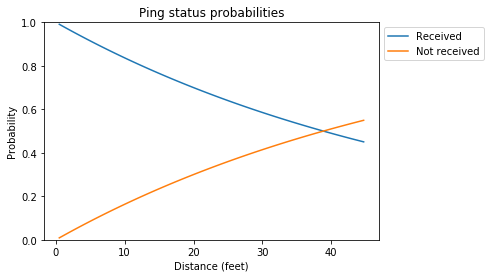

In [65]:
distance_range = np.linspace(distance_range_min, distance_range_max, 100)
ping_status_probabilities_range = np.array([ping_status_probabilities(d) for d in distance_range])
for ping_status_index in range(num_ping_statuses):
    plt.plot(distance_range,
             ping_status_probabilities_range[:, ping_status_index],
             label=ping_status_names_long[ping_status_index])
plt.ylim(0,1)
plt.xlabel('Distance (feet)')
plt.ylabel('Probability')
plt.title('Ping status probabilities')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

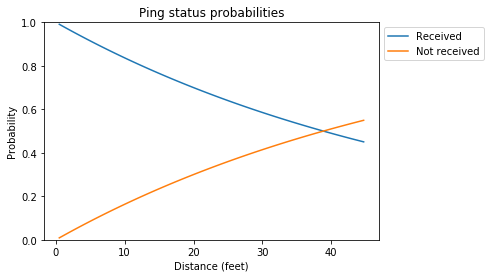

In [66]:
distance_range = np.linspace(distance_range_min, distance_range_max, 100)
ping_status_probabilities_range = ping_status_probabilities_fast(distance_range)
for ping_status_index in range(num_ping_statuses):
    plt.plot(distance_range,
             ping_status_probabilities_range[:, ping_status_index],
             label=ping_status_names_long[ping_status_index])
plt.ylim(0,1)
plt.xlabel('Distance (feet)')
plt.ylabel('Probability')
plt.title('Ping status probabilities')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

In [67]:
def discrete_sample(p_array):
    return np.random.choice(len(p_array), p=p_array)

In [68]:
def y_discrete_bar_x_sample(x):
    return np.apply_along_axis(discrete_sample,
                               axis=1,
                               arr=np.array([ping_status_probabilities(d) for d in distances(x)]))

In [69]:
def y_discrete_bar_x_sample_fast(x):
    return np.apply_along_axis(lambda p_array: np.random.choice(len(p_array), p=p_array),
                               axis=-1,
                               arr=ping_status_probabilities_fast(distances_fast(x)))

In [70]:
y_discrete_bar_x_sample(np.array([1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0]))

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [71]:
y_discrete_bar_x_sample_fast(np.array([1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0]))

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [72]:
y_discrete_bar_x_sample(np.array([10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]))

array([0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], dtype=int64)

In [73]:
y_discrete_bar_x_sample_fast(np.array([10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]))

array([0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], dtype=int64)

In [74]:
np.array([y_discrete_bar_x_sample(x) for x in np.array([[1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0],
                                  [10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]])])

array([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
        0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]], dtype=int64)

In [75]:
y_discrete_bar_x_sample_fast(np.array([[1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0],
                                       [10.0, 10.0, 20.0, 20.0, 30.0, 30.0, 40.0, 40.0, 50.0, 50.0, 60.0, 60.0, 70.0, 70.0]]))

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
        0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0]], dtype=int64)

Generate 1,000 samples (using our test value for $\mathbf{X}$) to make sure they have the properties we expect.

In [76]:
time_start = time.clock()
y_discrete_bar_x_samples = np.array([y_discrete_bar_x_sample(test_x_value) for i in range(1000)])
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 1.46611393446


In [77]:
time_start = time.clock()
y_discrete_bar_x_samples_fast = y_discrete_bar_x_sample_fast(np.tile(test_x_value, (1000,1)))
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 1.1525746549


In [78]:
distances_test_x_value = distances(test_x_value)

In [79]:
distances_fast_test_x_value = distances_fast(test_x_value)

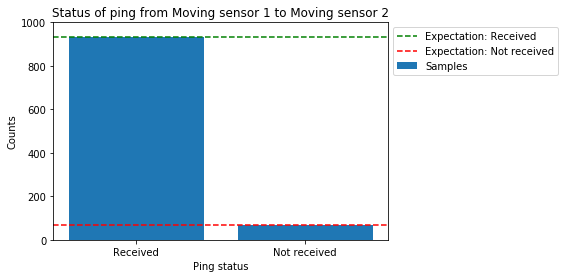

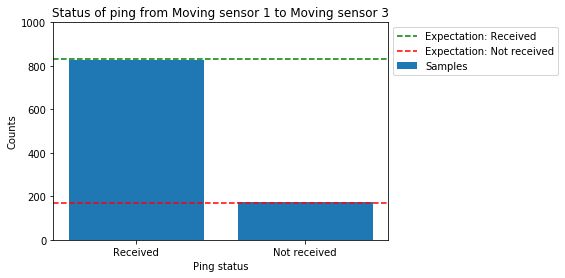

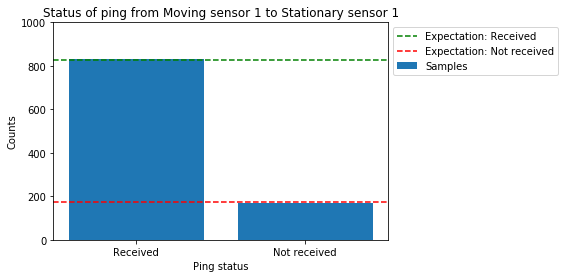

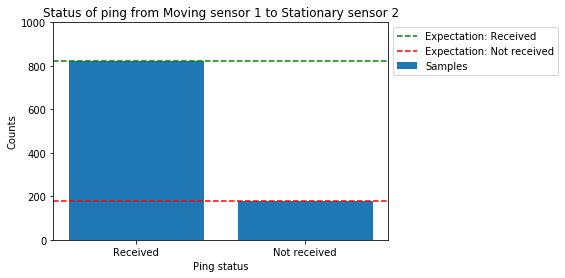

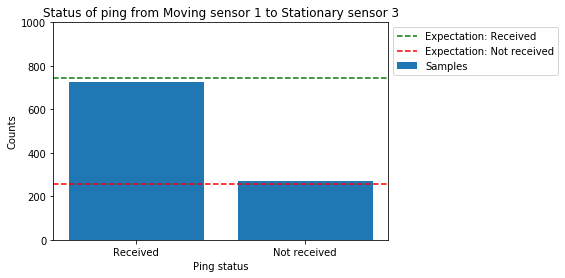

...

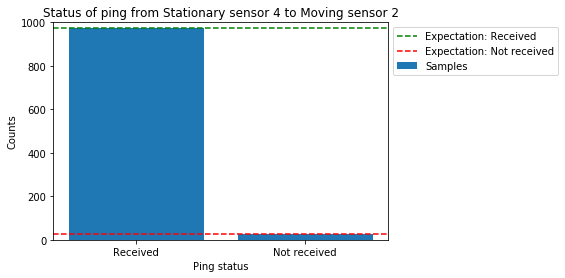

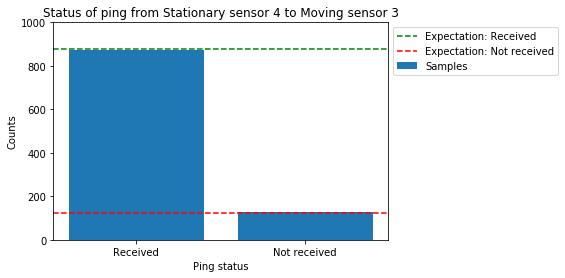

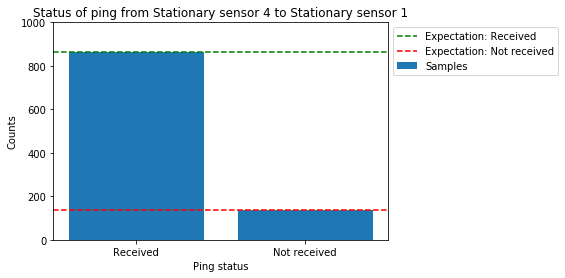

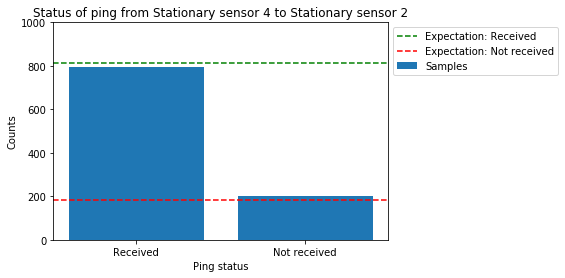

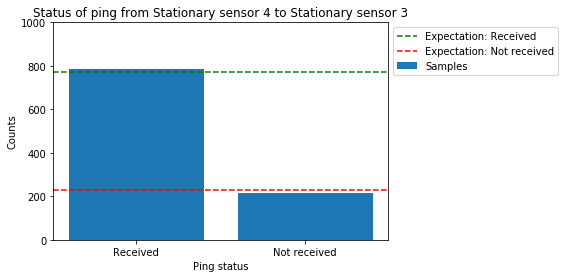

In [80]:
for y_discrete_var_index in range(num_y_discrete_vars):
    plt.bar(range(num_ping_statuses), np.bincount(y_discrete_bar_x_samples[:,y_discrete_var_index]), label='Samples')
    for ping_status_index in range(num_ping_statuses):
        plt.axhline(y=ping_status_probabilities(distances_test_x_value[y_discrete_var_index])[ping_status_index]*1000,
                    linestyle='dashed',
                    color=['green', 'red'][ping_status_index],
                    label='Expectation: {}'.format(ping_status_names_long[ping_status_index]))
    plt.xticks(range(num_ping_statuses), ping_status_names_long)
    plt.xlabel('Ping status')
    plt.ylabel('Counts')
    plt.title(y_discrete_names_long[y_discrete_var_index])
    plt.ylim(0, 1000)
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

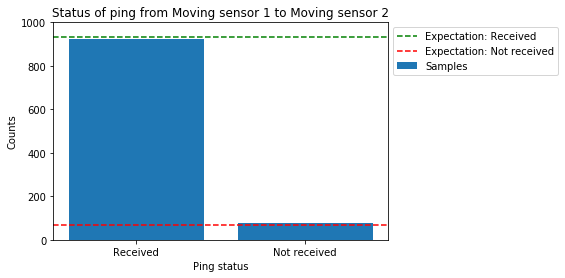

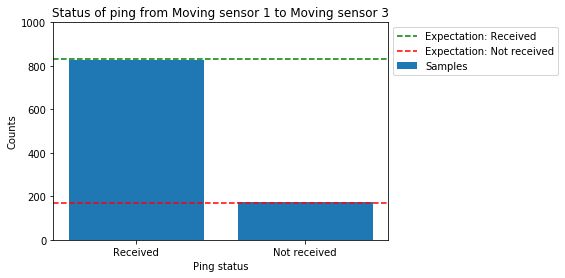

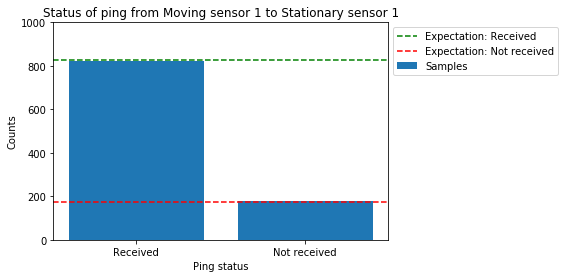

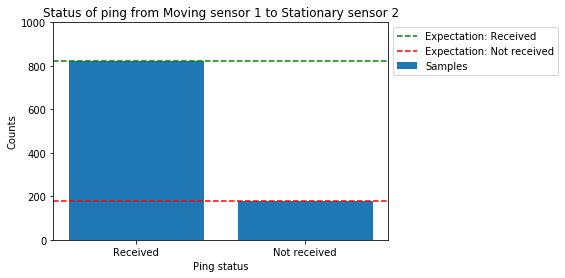

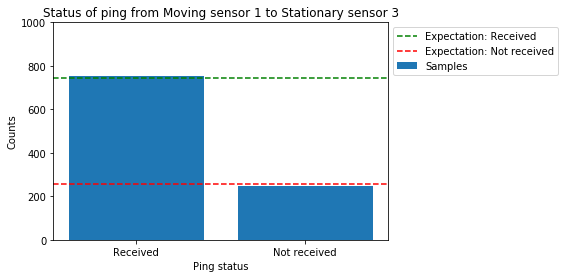

...

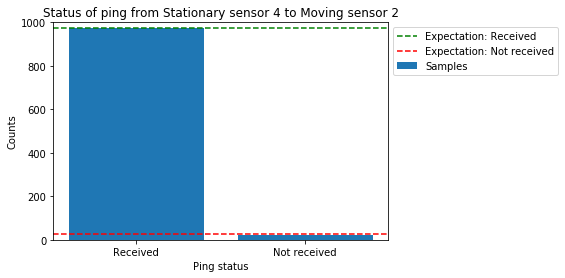

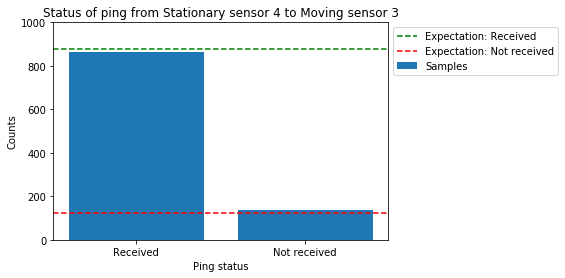

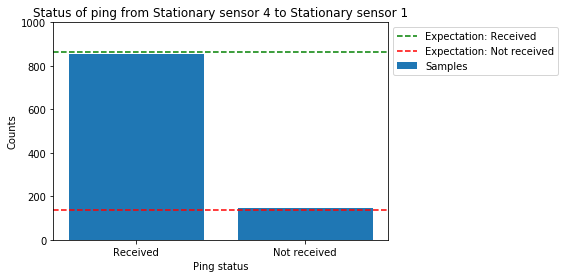

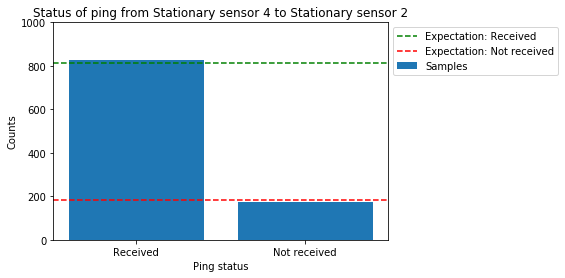

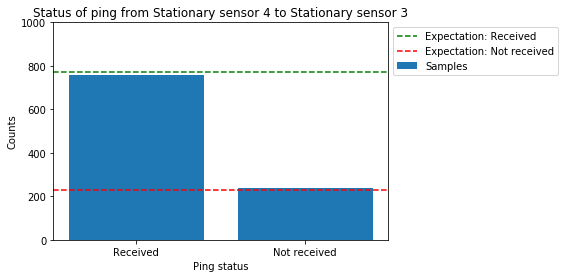

In [81]:
for y_discrete_var_index in range(num_y_discrete_vars):
    plt.bar(range(num_ping_statuses), np.bincount(y_discrete_bar_x_samples_fast[:,y_discrete_var_index]), label='Samples')
    for ping_status_index in range(num_ping_statuses):
        plt.axhline(y=ping_status_probabilities_fast(distances_fast_test_x_value[y_discrete_var_index])[ping_status_index]*1000,
                    linestyle='dashed',
                    color=['green', 'red'][ping_status_index],
                    label='Expectation: {}'.format(ping_status_names_long[ping_status_index]))
    plt.xticks(range(num_ping_statuses), ping_status_names_long)
    plt.xlabel('Ping status')
    plt.ylabel('Counts')
    plt.title(y_discrete_names_long[y_discrete_var_index])
    plt.ylim(0, 1000)
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

In [82]:
rssi_untruncated_mean_intercept = -64.0 # Value for real data is approximately -64.0
rssi_untruncated_mean_slope = -20.0 # Value for real data is approximately -20.0
rssi_untruncated_std_dev = 9.0 # Value for real data is approximately 9.0
lower_rssi_cutoff = -82.0 # Value for real data is approximately -82.0

In [83]:
def rssi_untruncated_mean(distance):
    return rssi_untruncated_mean_intercept + rssi_untruncated_mean_slope*math.log10(distance)

In [84]:
def rssi_untruncated_mean_fast(distance):
    return rssi_untruncated_mean_intercept + rssi_untruncated_mean_slope*np.log10(distance)

In [85]:
rssi_untruncated_mean(5.0)

-77.97940008672037

In [86]:
rssi_untruncated_mean_fast(5.0)

-77.979400086720375

In [87]:
np.array([rssi_untruncated_mean(d) for d in np.array([5.0, 10.0, 15.0])])

array([-77.97940009, -84.        , -87.52182518])

In [88]:
rssi_untruncated_mean_fast(np.array([5.0, 10.0, 15.0]))

array([-77.97940009, -84.        , -87.52182518])

In [89]:
rssi_untruncated_mean_fast(np.array([[5.0, 10.0, 15.0], [5.0, 10.0, 15.0]]))

array([[-77.97940009, -84.        , -87.52182518],
       [-77.97940009, -84.        , -87.52182518]])

In [90]:
def rssi_sample(distance):
    return stats.truncnorm.rvs(a=(lower_rssi_cutoff - rssi_untruncated_mean(distance))/rssi_untruncated_std_dev,
                               b=np.inf,
                               loc=rssi_untruncated_mean(distance),
                               scale=rssi_untruncated_std_dev)

In [91]:
def rssi_sample_fast(distance):
    return stats.truncnorm.rvs(a=(lower_rssi_cutoff - rssi_untruncated_mean_fast(distance))/rssi_untruncated_std_dev,
                               b=np.inf,
                               loc=rssi_untruncated_mean_fast(distance),
                               scale=rssi_untruncated_std_dev)

In [92]:
rssi_sample(5.0)

-70.151025164572829

In [93]:
rssi_sample_fast(5.0)

-72.541217937069433

In [94]:
np.array([rssi_sample(d) for d in np.array([5.0, 10.0, 15.0])])

array([-75.78883944, -68.02399281, -78.83263109])

In [95]:
rssi_sample_fast(np.array([5.0, 10.0, 15.0]))

array([-78.32341213, -78.08853706, -77.29647598])

In [96]:
rssi_sample_fast(np.array([[5.0, 10.0, 15.0], [5.0, 10.0, 15.0]]))

array([[-80.6333393 , -79.70571251, -79.56910748],
       [-76.16291674, -80.386254  , -76.78079832]])

In [97]:
def rssi_truncated_mean(distance):
    return stats.truncnorm.stats(a=(lower_rssi_cutoff - rssi_untruncated_mean(distance))/rssi_untruncated_std_dev,
                                 b=np.inf,
                                 loc=rssi_untruncated_mean(distance),
                                 scale=rssi_untruncated_std_dev,
                                 moments='m')

In [98]:
def rssi_truncated_mean_fast(distance):
    return stats.truncnorm.stats(a=(lower_rssi_cutoff - rssi_untruncated_mean_fast(distance))/rssi_untruncated_std_dev,
                                 b=np.inf,
                                 loc=rssi_untruncated_mean_fast(distance),
                                 scale=rssi_untruncated_std_dev,
                                 moments='m')

In [99]:
rssi_truncated_mean(5.0)

c:\python27\lib\site-packages\scipy\stats\_continuous_distns.py:4870: RuntimeWarning: invalid value encountered in multiply
  mu2 = 1 + (a*pA - b*pB) / d - mu*mu


array(-73.1471889487491)

In [100]:
rssi_truncated_mean_fast(5.0)

array(-73.1471889487491)

In [101]:
np.array([rssi_truncated_mean(d) for d in np.array([5.0, 10.0, 15.0])])

array([-73.14718895, -75.49923941, -76.49543138])

In [102]:
rssi_truncated_mean_fast(np.array([5.0, 10.0, 15.0]))

array([-73.14718895, -75.49923941, -76.49543138])

In [103]:
rssi_range_min = rssi_untruncated_mean_fast(distance_range_max)
rssi_range_max = rssi_untruncated_mean_fast(distance_range_min)

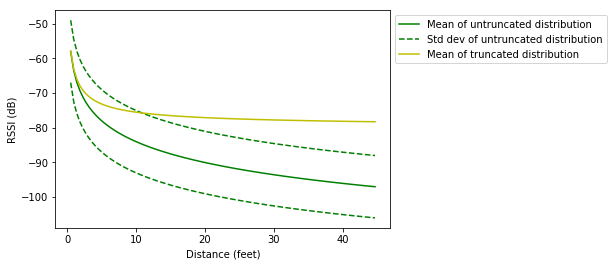

In [104]:
distance_range = np.linspace(distance_range_min, distance_range_max, 100)
plt.plot(distance_range,
         np.array([rssi_untruncated_mean(d) for d in distance_range]),
         'g-',
         label='Mean of untruncated distribution')
plt.plot(distance_range,
         np.array([rssi_untruncated_mean(d) - rssi_untruncated_std_dev for d in distance_range]),
         'g-',
         linestyle='dashed',
         label='Std dev of untruncated distribution')
plt.plot(distance_range,
         np.array([rssi_untruncated_mean(d) + rssi_untruncated_std_dev for d in distance_range]),
         'g-',
         linestyle='dashed')
plt.plot(distance_range,
         np.array([rssi_truncated_mean(d) for d in distance_range]),
         'y-',
         label='Mean of truncated distribution')
plt.xlabel('Distance (feet)')
plt.ylabel('RSSI (dB)')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

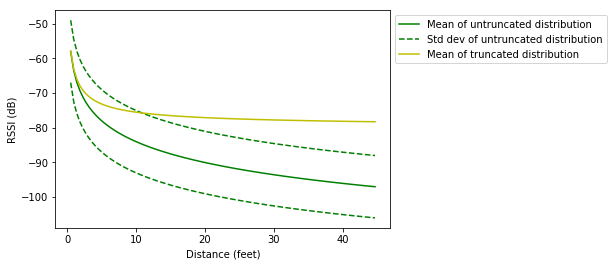

In [105]:
distance_range = np.linspace(distance_range_min, distance_range_max, 100)
plt.plot(distance_range,
         rssi_untruncated_mean_fast(distance_range),
         'g-',
         label='Mean of untruncated distribution')
plt.plot(distance_range,
         rssi_untruncated_mean_fast(distance_range) - rssi_untruncated_std_dev,
         'g-',
         linestyle='dashed',
         label='Std dev of untruncated distribution')
plt.plot(distance_range,
         rssi_untruncated_mean_fast(distance_range) + rssi_untruncated_std_dev,
         'g-',
         linestyle='dashed')
plt.plot(distance_range,
         rssi_truncated_mean_fast(distance_range),
         'y-',
         label='Mean of truncated distribution')
plt.xlabel('Distance (feet)')
plt.ylabel('RSSI (dB)')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

In [106]:
def y_continuous_bar_x_sample(x):
    return np.array([rssi_sample(distance) for distance in distances(x)])

In [107]:
def y_continuous_bar_x_sample_fast(x):
    return rssi_sample_fast(distances_fast(x))

In [108]:
y_continuous_bar_x_sample(test_x_value)

array([-72.13988709, -77.81871296, -71.62864914, -69.39017176,
       -80.80949678, -81.62743326, -68.80431763, -79.34227814,
       -78.07977304, -80.1062439 , -75.60772172, -68.94326547,
       -69.49986596, -80.47164537, -74.77994727, -80.32348366,
       -77.10286673, -74.54585482, -79.07364072, -73.96307487,
       -81.60993913, -71.9205488 , -67.22369007, -75.63708124,
       -70.22938604, -79.26051978, -80.77296422, -81.11162825,
       -70.40168577, -81.61640778, -77.89777275, -76.65229681,
       -81.56418124, -78.80237148, -77.78879957, -79.47511753,
       -73.2855203 , -61.85857522, -72.13256615, -74.77767345,
       -76.38474134, -78.11926552])

In [109]:
y_continuous_bar_x_sample_fast(test_x_value)

array([-62.42743558, -76.98422673, -80.721573  , -75.15802696,
       -81.66234318, -72.89231352, -73.54550126, -77.04366138,
       -77.72158785, -79.3374899 , -81.35500317, -53.99094314,
       -76.26042421, -80.38569055, -70.65826943, -78.42724293,
       -72.67696892, -69.92104227, -81.23089885, -75.03810961,
       -70.68295621, -77.93434119, -80.58130944, -67.34876012,
       -81.87323952, -81.02264336, -77.77666798, -71.37759412,
       -77.27147455, -77.89833622, -74.70073798, -70.74485345,
       -75.11156253, -76.20477112, -78.71300947, -73.73637891,
       -75.38300842, -52.20755118, -73.80831224, -73.61881774,
       -75.83185858, -72.86985864])

In [110]:
y_continuous_bar_x_sample_fast(np.tile(test_x_value, (3,1)))

array([[-58.92236457, -76.45598331, -78.81124746, -78.99782676,
        -80.27674618, -62.72116322, -81.78669435, -66.5378319 ,
        -73.08151279, -78.67911826, -73.00982366, -54.20887352,
        -68.04561467, -76.24743383, -80.37452169, -78.50821131,
        -79.9272771 , -81.6699509 , -64.49446542, -75.56188477,
        -79.67265936, -77.64353933, -81.93559456, -77.49112296,
        -81.95973226, -74.54621541, -81.03625264, -77.27501686,
        -81.38957781, -71.92921758, -80.40083951, -73.45971554,
        -79.91661688, -71.43267009, -68.21777238, -70.57699012,
        -69.93128197, -60.74626159, -78.91143921, -80.62834909,
        -72.05435992, -80.82076787],
       [-61.94756908, -80.19398261, -77.3302353 , -78.42799986,
        -74.69630076, -67.16695077, -67.0004183 , -79.11777732,
        -77.84169644, -78.62332866, -77.99274018, -65.6688519 ,
        -63.88276197, -80.49746619, -74.23894965, -81.83563178,
        -81.76061592, -65.11672505, -76.8996986 , -73.25706191,
   

In [111]:
time_start = time.clock()
y_continuous_bar_x_samples = np.array([y_continuous_bar_x_sample(test_x_value) for i in range(1000)])
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 2.99108437714


In [112]:
time_start = time.clock()
y_continuous_bar_x_samples_fast = y_continuous_bar_x_sample_fast(np.tile(test_x_value, (1000, 1)))
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 0.0153433534535


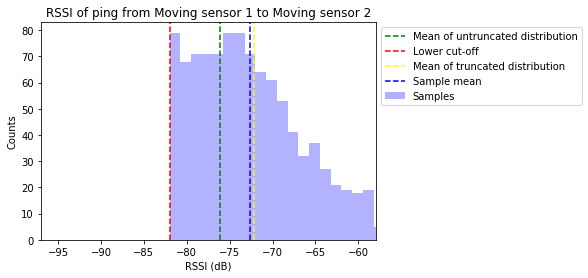

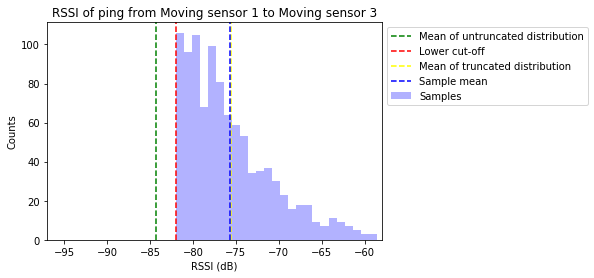

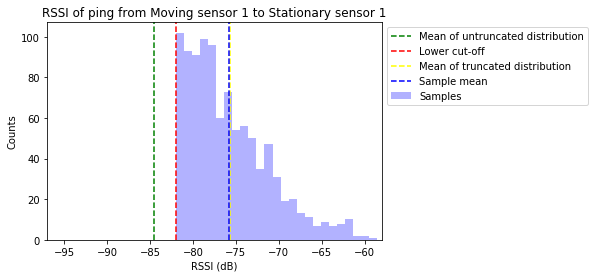

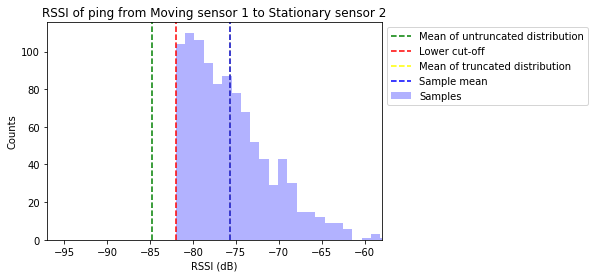

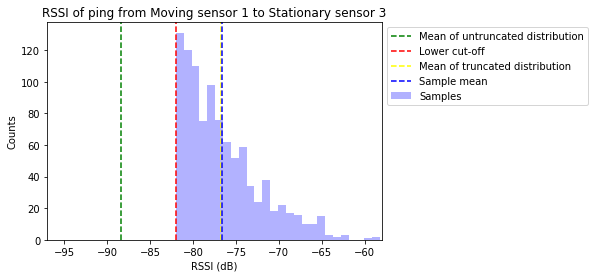

...

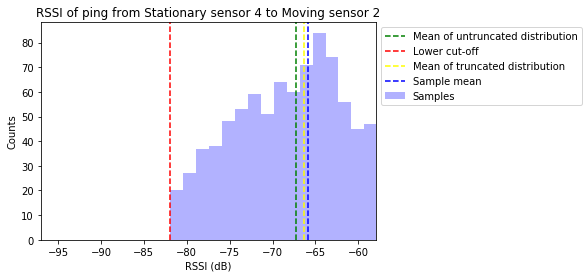

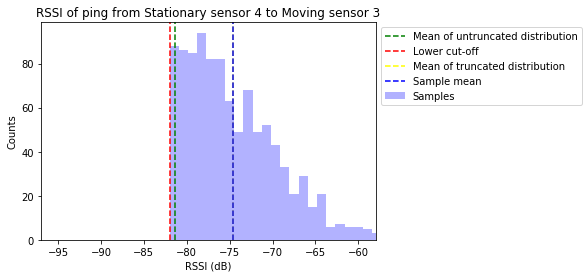

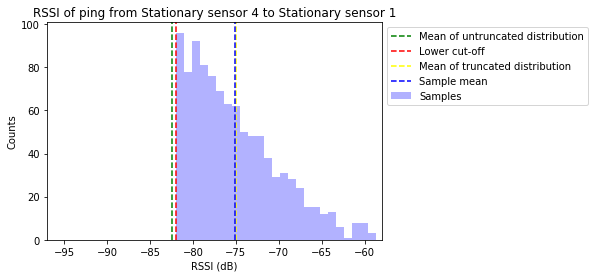

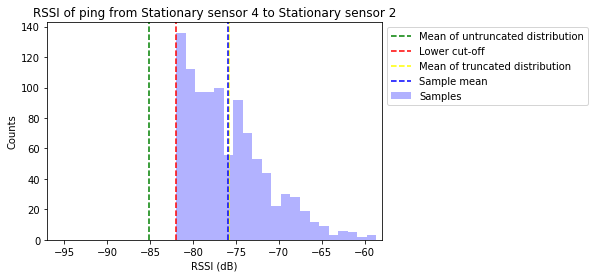

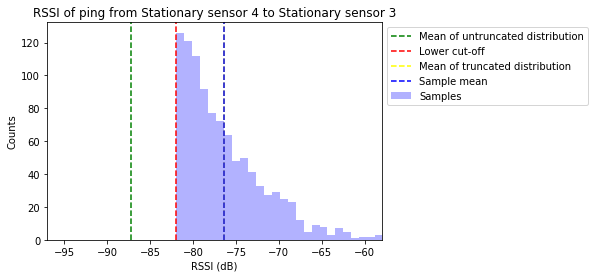

In [113]:
for y_continuous_var_index in range(num_y_continuous_vars):
    plt.hist(y_continuous_bar_x_samples[:,y_continuous_var_index],
             bins=30,
             facecolor='blue',
             alpha=0.3,
             label='Samples')
    plt.axvline(x=rssi_untruncated_mean(distances_test_x_value[y_continuous_var_index]),
                linestyle='dashed',
                color='green',
                label='Mean of untruncated distribution')
    plt.axvline(lower_rssi_cutoff,
                linestyle='dashed',
                color='red',
                label='Lower cut-off')
    plt.axvline(x=rssi_truncated_mean(distances_test_x_value[y_continuous_var_index]),
                linestyle='dashed',
                color='yellow',
                label='Mean of truncated distribution')
    plt.axvline(np.mean(y_continuous_bar_x_samples[:,y_continuous_var_index]),
                linestyle='dashed',
                color='blue',
                label='Sample mean')
    plt.xlabel('RSSI (dB)')
    plt.ylabel('Counts')
    plt.title(y_continuous_names_long[y_continuous_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.xlim(rssi_range_min, rssi_range_max)
    plt.show()

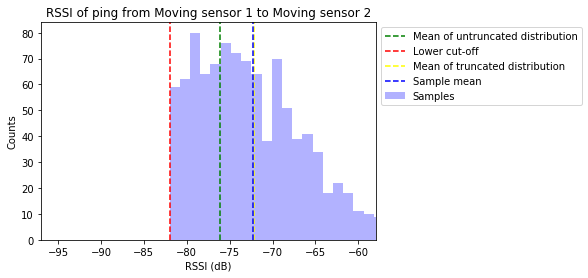

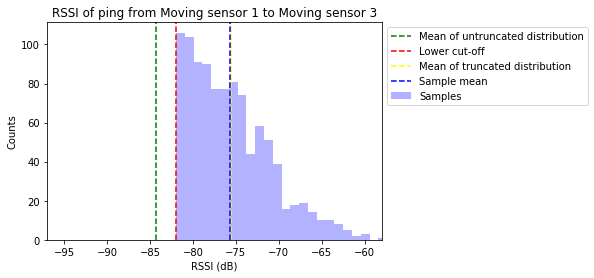

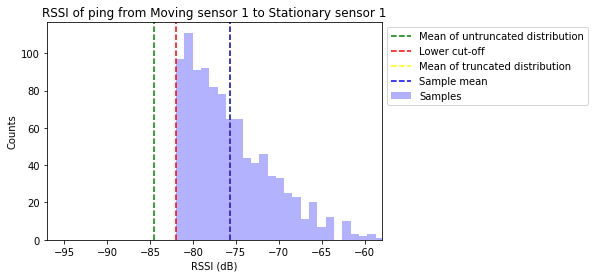

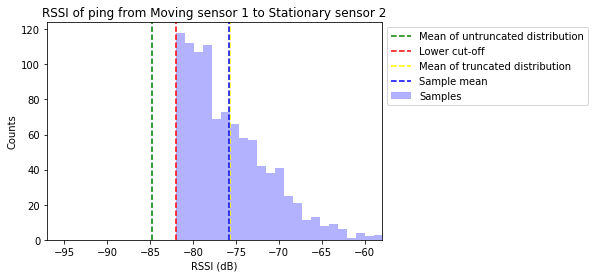

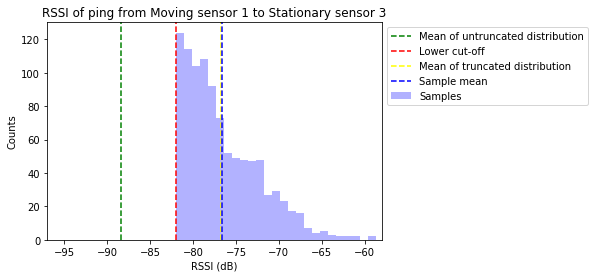

...

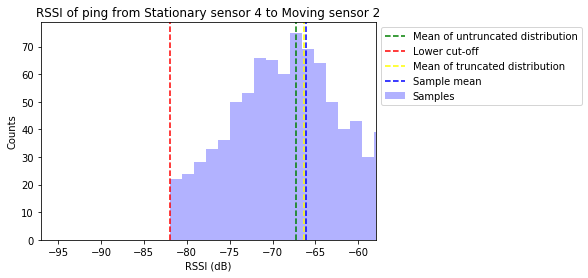

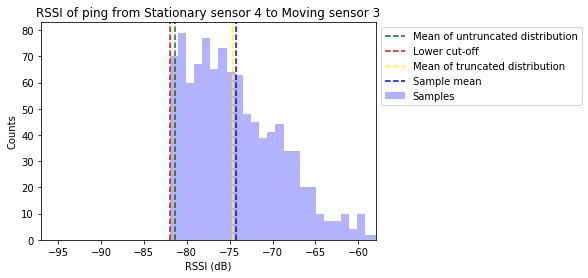

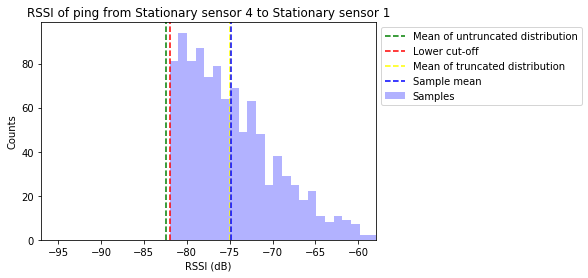

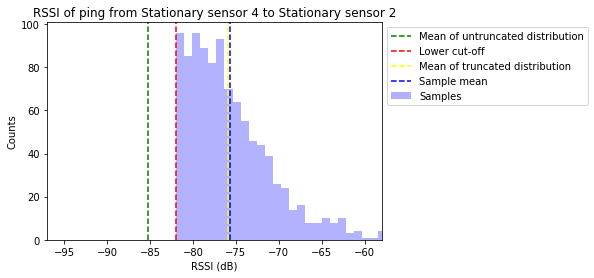

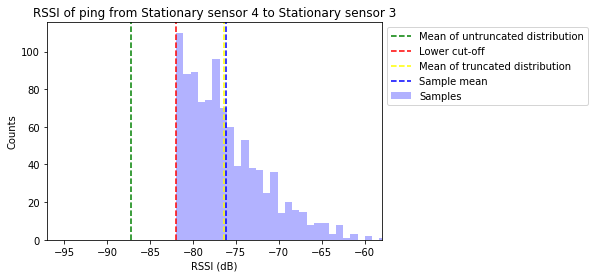

In [114]:
for y_continuous_var_index in range(num_y_continuous_vars):
    plt.hist(y_continuous_bar_x_samples_fast[:,y_continuous_var_index],
             bins=30,
             facecolor='blue',
             alpha=0.3,
             label='Samples')
    plt.axvline(x=rssi_untruncated_mean_fast(distances_fast_test_x_value[y_continuous_var_index]),
                linestyle='dashed',
                color='green',
                label='Mean of untruncated distribution')
    plt.axvline(lower_rssi_cutoff,
                linestyle='dashed',
                color='red',
                label='Lower cut-off')
    plt.axvline(x=rssi_truncated_mean_fast(distances_fast_test_x_value[y_continuous_var_index]),
                linestyle='dashed',
                color='yellow',
                label='Mean of truncated distribution')
    plt.axvline(np.mean(y_continuous_bar_x_samples_fast[:,y_continuous_var_index]),
                linestyle='dashed',
                color='blue',
                label='Sample mean')
    plt.xlabel('RSSI (dB)')
    plt.ylabel('Counts')
    plt.title(y_continuous_names_long[y_continuous_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.xlim(rssi_range_min, rssi_range_max)
    plt.show()

Calculate probability density of $\mathbf{Y}$ given $\mathbf{X}$

In [115]:
def log_ping_status_probability(distance, ping_status):
    return math.log(ping_status_probabilities(distance)[ping_status])

In [116]:
def log_rssi_probability_density(distance, rssi):
    return stats.truncnorm.logpdf(rssi,
                                  a=(lower_rssi_cutoff - rssi_untruncated_mean(distance))/rssi_untruncated_std_dev,
                                  b=np.inf,
                                  loc=rssi_untruncated_mean(distance),
                                  scale=rssi_untruncated_std_dev)

In [117]:
def log_f_y_bar_x(x, y_discrete, y_continuous):
    distances_x = distances(x)
    log_ping_status_probabilities = np.array([
        log_ping_status_probability(distances_x[y_discrete_var_index],
                                    y_discrete[y_discrete_var_index])
        for y_discrete_var_index in range(num_y_discrete_vars)
    ])
    log_rssi_probability_densities = np.array([
        log_rssi_probability_density(distances_x[y_continuous_var_index],
                                     y_continuous[y_continuous_var_index])
        for y_continuous_var_index in range(num_y_continuous_vars)
    ])
    log_rssi_probability_densities_observed = log_rssi_probability_densities[y_discrete == 0]
    return np.sum(log_ping_status_probabilities) + np.sum(log_rssi_probability_densities_observed)

In [118]:
def left_truncnorm_logpdf(x, untruncated_mean, untruncated_std_dev, left_cutoff):
    logf = np.array(np.subtract(stats.norm.logpdf(x, loc=untruncated_mean, scale=untruncated_std_dev),
                                np.log(1 - stats.norm.cdf(left_cutoff, loc=untruncated_mean, scale=untruncated_std_dev))))
    logf[x < left_cutoff] = -np.inf
    return logf

In [119]:
def log_f_y_bar_x_fast(x, y_discrete, y_continuous):
    distances_fast_x = distances_fast(x)
    receive_probability = receive_probability_zero_distance*np.exp(
        np.log(receive_probability_reference_distance/receive_probability_zero_distance)*distances_fast_x/reference_distance
    )
    return np.sum(np.concatenate((
        np.log(np.choose(y_discrete,
                         np.row_stack((receive_probability,
                                       1-receive_probability)))),
        left_truncnorm_logpdf(y_continuous,
                              rssi_untruncated_mean_fast(distances_fast_x),
                              rssi_untruncated_std_dev,
                              lower_rssi_cutoff)[y_discrete == 0]
    )))

In [120]:
log_f_y_bar_x(test_x_value, np.repeat(0, num_y_discrete_vars), np.repeat(-81.0, num_y_continuous_vars))

-110.88986277527758

In [121]:
log_f_y_bar_x_fast(test_x_value, np.repeat(0, num_y_discrete_vars), np.repeat(-81.0, num_y_continuous_vars))

-110.88986277527758

In [122]:
log_f_y_bar_x(test_x_value, np.repeat(1, num_y_discrete_vars), np.repeat(-75.0, num_y_continuous_vars))

-84.016165364799718

In [123]:
log_f_y_bar_x_fast(test_x_value, np.repeat(1, num_y_discrete_vars), np.repeat(-75.0, num_y_continuous_vars))

-84.016165364799718

In [124]:
log_f_y_bar_x(test_x_value, np.repeat([1,0], num_y_discrete_vars/2), np.repeat(-77.0, num_y_continuous_vars))

-102.61817558820729

In [125]:
log_f_y_bar_x_fast(test_x_value, np.repeat([1,0], num_y_discrete_vars/2), np.repeat(-77.0, num_y_continuous_vars))

-102.61817558820729

Using our test value for $\mathbf{X}$, plot the dependence of $f(\mathbf{Y} | \mathbf{X})$ on each sensor reading (holding the values of all of the other sensor readings fixed), to make sure it has the shape we expect.

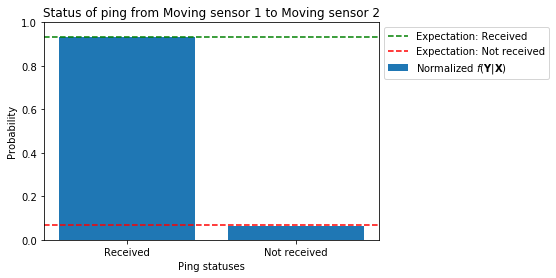

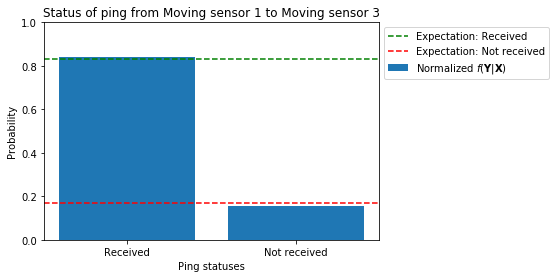

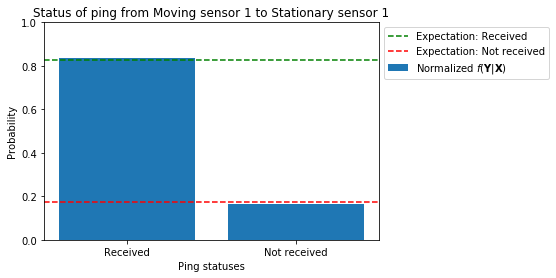

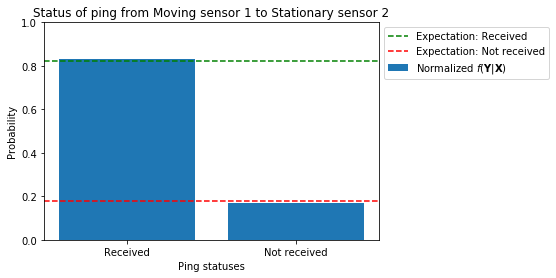

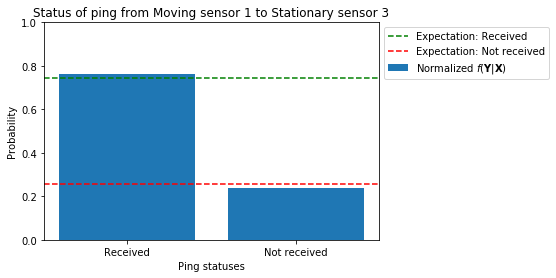

...

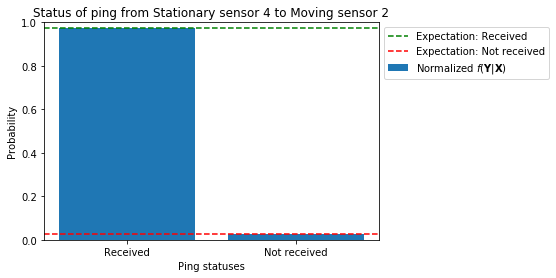

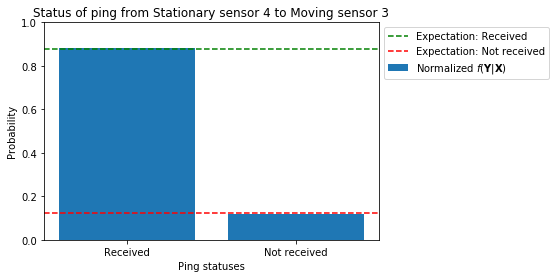

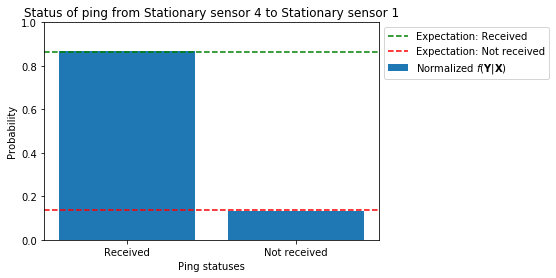

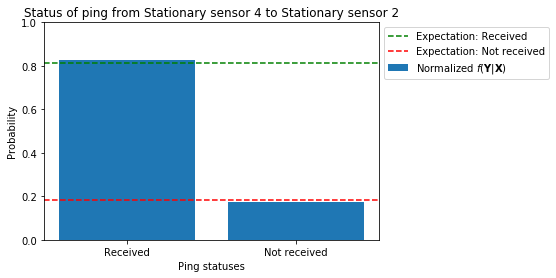

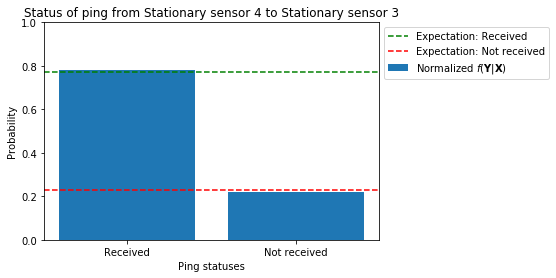

In [126]:
mean_rssi_values = np.array([rssi_truncated_mean(d) for d in distances_test_x_value])
for y_discrete_var_index in range(num_y_discrete_vars):
    test_y_discrete_value = np.repeat(0, num_y_discrete_vars)
    test_y_continuous_value = np.copy(mean_rssi_values)
    probability_range = np.zeros(2, dtype='float')
    probability_density_range = np.zeros(100, dtype='float')
    rssi_range=np.linspace(mean_rssi_values[y_discrete_var_index] - 2*rssi_untruncated_std_dev,
                           mean_rssi_values[y_discrete_var_index] + 2*rssi_untruncated_std_dev,
                           100)
    for rssi_index in range(len(rssi_range)):
        test_y_continuous_value[y_discrete_var_index] = rssi_range[rssi_index]
        probability_density_range[rssi_index] = math.exp(log_f_y_bar_x(test_x_value,
                                                                       test_y_discrete_value,
                                                                       test_y_continuous_value))
    probability_range[0] = np.sum(probability_density_range*((rssi_range_max-rssi_range_min)/100))
    test_y_discrete_value[y_discrete_var_index] = 1
    test_y_continuous_value = mean_rssi_values
    probability_range[1] = math.exp(log_f_y_bar_x(test_x_value,
                                                  test_y_discrete_value,
                                                  test_y_continuous_value))
    probability_range = probability_range/np.sum(probability_range)
    plt.bar(range(num_ping_statuses),
            probability_range,
            label='Normalized $f(\mathbf{Y}|\mathbf{X})$')
    for ping_status_index in range(num_ping_statuses):
        plt.axhline(y=ping_status_probabilities(distances_test_x_value[y_discrete_var_index])[ping_status_index],
                    linestyle='dashed',
                    color=['green', 'red'][ping_status_index],
                    label='Expectation: {}'.format(ping_status_names_long[ping_status_index]))
    plt.xticks(range(num_ping_statuses), ping_status_names_long)
    plt.ylim(0,1)
    plt.xlabel('Ping statuses')
    plt.ylabel('Probability')
    plt.title(y_discrete_names_long[y_discrete_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

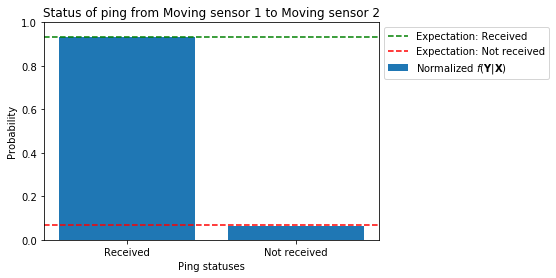

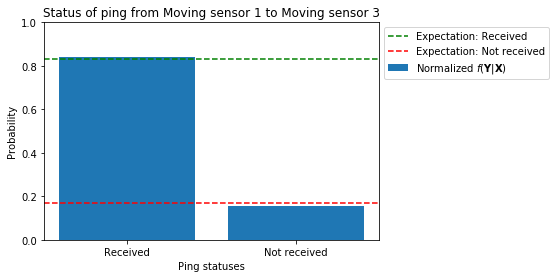

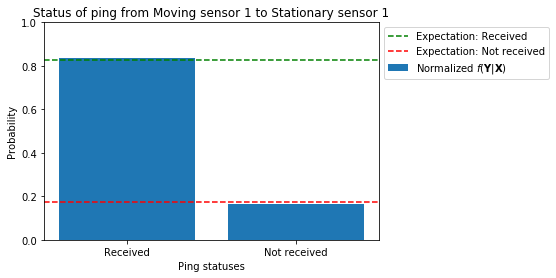

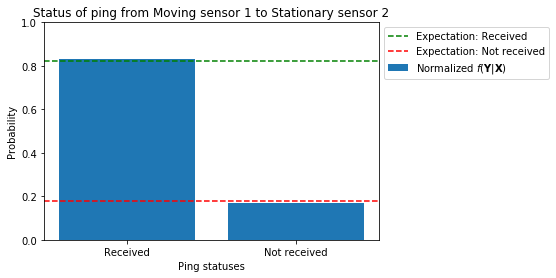

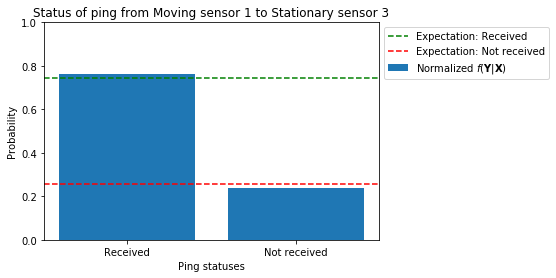

...

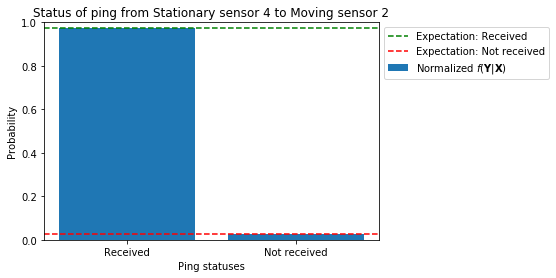

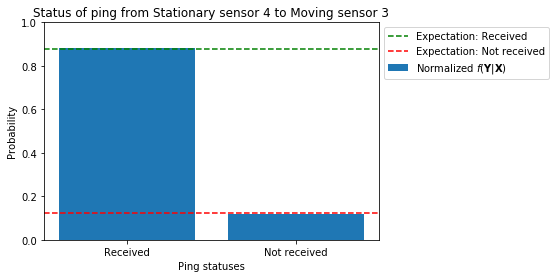

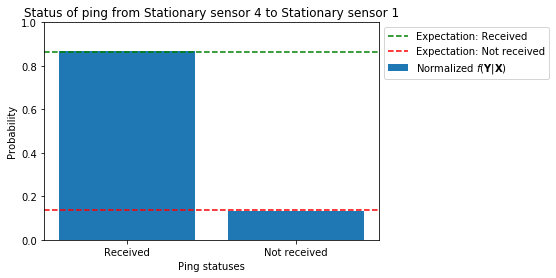

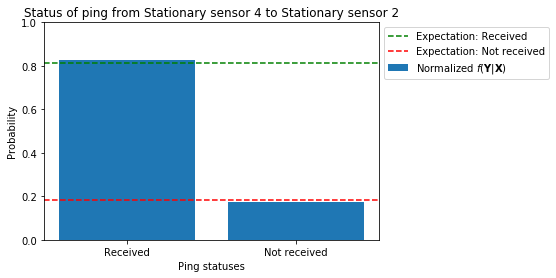

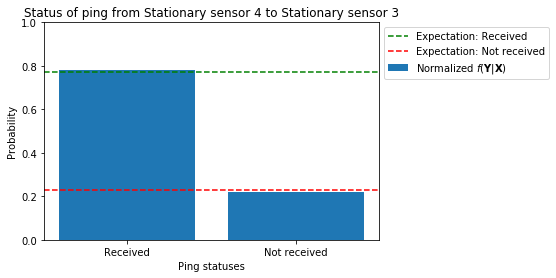

In [127]:
mean_rssi_values = rssi_truncated_mean_fast(distances_fast_test_x_value)
for y_discrete_var_index in range(num_y_discrete_vars):
    test_y_discrete_value = np.repeat(0, num_y_discrete_vars)
    test_y_continuous_value = np.copy(mean_rssi_values)
    probability_range = np.zeros(2, dtype='float')
    probability_density_range = np.zeros(100, dtype='float')
    rssi_range=np.linspace(mean_rssi_values[y_discrete_var_index] - 2*rssi_untruncated_std_dev,
                           mean_rssi_values[y_discrete_var_index] + 2*rssi_untruncated_std_dev,
                           100)
    for rssi_index in range(len(rssi_range)):
        test_y_continuous_value[y_discrete_var_index] = rssi_range[rssi_index]
        probability_density_range[rssi_index] = math.exp(log_f_y_bar_x_fast(test_x_value,
                                                                            test_y_discrete_value,
                                                                            test_y_continuous_value))
    probability_range[0] = np.sum(probability_density_range*((rssi_range_max-rssi_range_min)/100))
    test_y_discrete_value[y_discrete_var_index] = 1
    test_y_continuous_value = mean_rssi_values
    probability_range[1] = math.exp(log_f_y_bar_x_fast(test_x_value,
                                                       test_y_discrete_value,
                                                       test_y_continuous_value))
    probability_range = probability_range/np.sum(probability_range)
    plt.bar(range(num_ping_statuses),
            probability_range,
            label='Normalized $f(\mathbf{Y}|\mathbf{X})$')
    for ping_status_index in range(num_ping_statuses):
        plt.axhline(y=ping_status_probabilities(distances_test_x_value[y_discrete_var_index])[ping_status_index],
                    linestyle='dashed',
                    color=['green', 'red'][ping_status_index],
                    label='Expectation: {}'.format(ping_status_names_long[ping_status_index]))
    plt.xticks(range(num_ping_statuses), ping_status_names_long)
    plt.ylim(0,1)
    plt.xlabel('Ping statuses')
    plt.ylabel('Probability')
    plt.title(y_discrete_names_long[y_discrete_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

## Generate simulated $\mathbf{X}$ and $\mathbf{Y}$ data

Set the number of timesteps and initialize the variables.

In [128]:
num_timesteps = 100
t = np.zeros(num_timesteps, dtype='float')
x_t = np.zeros((num_timesteps, num_x_vars), dtype='float')
y_discrete_t = np.zeros((num_timesteps, num_y_discrete_vars), dtype='int')
y_continuous_t = np.zeros((num_timesteps, num_y_continuous_vars), dtype='float')

Calculate the simulated data for $t=0$.

In [129]:
t[0] = 0.0

In [130]:
x_t[0] = x_initial_sample_fast()

In [131]:
y_discrete_t[0] = y_discrete_bar_x_sample_fast(x_t[0])

In [132]:
y_continuous_t[0] = y_continuous_bar_x_sample_fast(x_t[0])

Calculate the simulated data for $t>0$.

In [133]:
timestep_size = 1.0

In [134]:
for t_index in range(1,num_timesteps):
    t[t_index] = t[t_index - 1] + timestep_size
    x_t[t_index] = x_bar_x_prev_sample_fast(x_t[t_index - 1])
    y_discrete_t[t_index] = y_discrete_bar_x_sample_fast(x_t[t_index])
    y_continuous_t[t_index] = y_continuous_bar_x_sample_fast(x_t[t_index])

Find the overall maximum and minimum $h$ and $v$ values across the entire simulation.

In [135]:
h_v_min_max = np.array([[np.min(x_t[:,range(0, num_x_vars, 2)]),
                         np.max(x_t[:,range(0, num_x_vars, 2)])],
                        [np.min(x_t[:,range(1, num_x_vars, 2)]),
                         np.max(x_t[:,range(1, num_x_vars, 2)])]])

Plot the positions of the sensors to make sure they have the properties we expect.

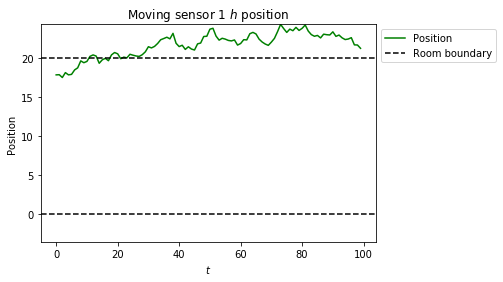

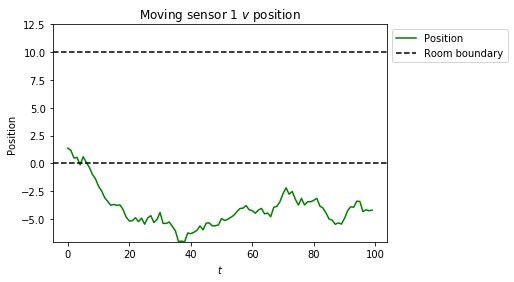

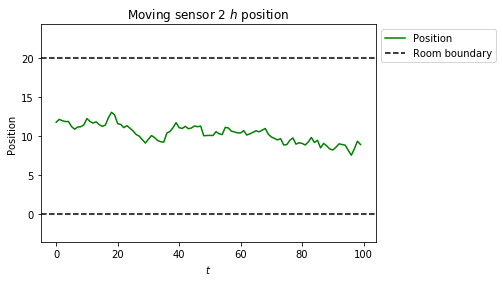

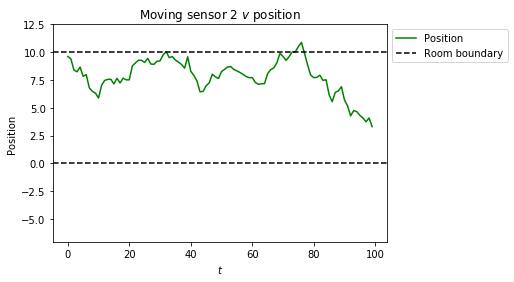

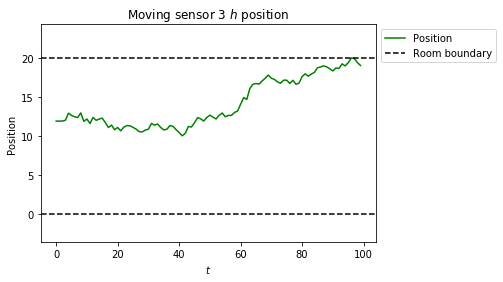

...

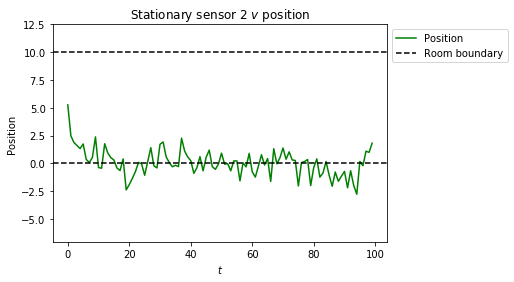

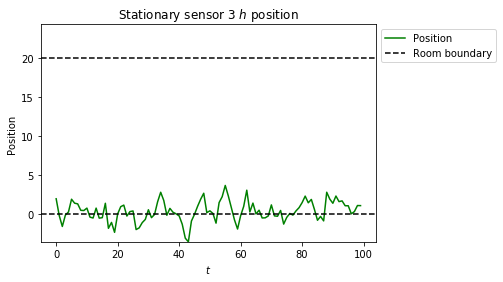

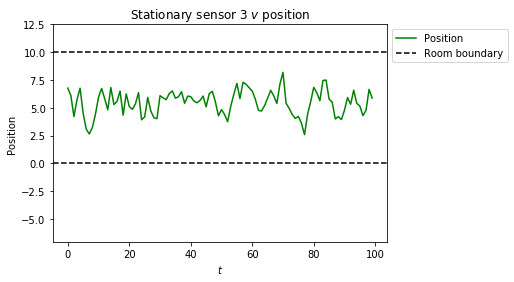

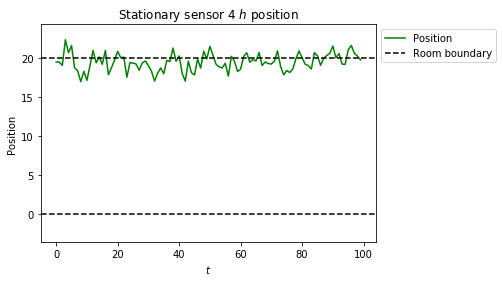

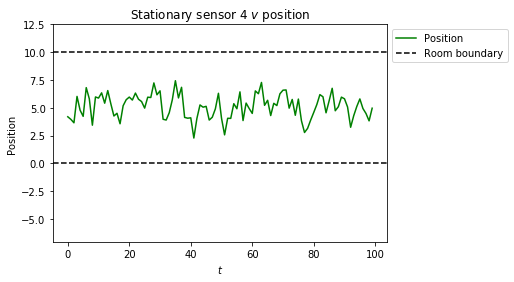

In [136]:
for x_var_index in range(num_x_vars):
    plt.plot(t, x_t[:, x_var_index], 'g-', label='Position')
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.plot
    plt.xlabel('$t$')
    plt.ylabel('Position')
    plt.title(x_names_long[x_var_index])
    plt.ylim(np.min([0, h_v_min_max[x_var_index % 2, 0]]),
             np.max([room_size[x_var_index % 2], h_v_min_max[x_var_index % 2, 1]]))
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

Plot the sensor readings against the actual distances to the sensors, to make sure they have the properties we expect.

In [137]:
distances_t = np.array([distances(x) for x in x_t])

In [138]:
distances_fast_t = distances_fast(x_t)

In [139]:
distances_t[0:2]

array([[ 10.23021993,   6.20477246,  13.96862064,  10.32639979,
         16.77451344,   3.26809704,  10.23021993,   6.41218356,
          3.74218613,   5.57632349,  10.21670323,   9.42870977,
          6.20477246,   6.41218356,   9.63611881,   4.18114847,
         10.57386738,   7.6455051 ,  13.96862064,   3.74218613,
          9.63611881,   7.32227305,   9.39085201,  13.07244019,
         10.32639979,   5.57632349,   4.18114847,   7.32227305,
          6.49452789,  11.26609948,  16.77451344,  10.21670323,
         10.57386738,   9.39085201,   6.49452789,  17.72107925,
          3.26809704,   9.42870977,   7.6455051 ,  13.07244019,
         11.26609948,  17.72107925],
       [ 10.02426095,   6.28745923,  13.88270529,   8.88081365,
         18.72367941,   3.22309559,  10.02426095,   6.20723105,
          3.91397029,   7.55997948,  12.76998516,   9.14640521,
          6.28745923,   6.20723105,   9.28243386,   2.91859754,
         12.45405773,   7.61437738,  13.88270529,   3.91397029,
   

In [140]:
distances_fast_t[0:2]

array([[ 10.23021993,   6.20477246,  13.96862064,  10.32639979,
         16.77451344,   3.26809704,  10.23021993,   6.41218356,
          3.74218613,   5.57632349,  10.21670323,   9.42870977,
          6.20477246,   6.41218356,   9.63611881,   4.18114847,
         10.57386738,   7.6455051 ,  13.96862064,   3.74218613,
          9.63611881,   7.32227305,   9.39085201,  13.07244019,
         10.32639979,   5.57632349,   4.18114847,   7.32227305,
          6.49452789,  11.26609948,  16.77451344,  10.21670323,
         10.57386738,   9.39085201,   6.49452789,  17.72107925,
          3.26809704,   9.42870977,   7.6455051 ,  13.07244019,
         11.26609948,  17.72107925],
       [ 10.02426095,   6.28745923,  13.88270529,   8.88081365,
         18.72367941,   3.22309559,  10.02426095,   6.20723105,
          3.91397029,   7.55997948,  12.76998516,   9.14640521,
          6.28745923,   6.20723105,   9.28243386,   2.91859754,
         12.45405773,   7.61437738,  13.88270529,   3.91397029,
   

Calculate overall minimum and maximum distances generated in the simulation

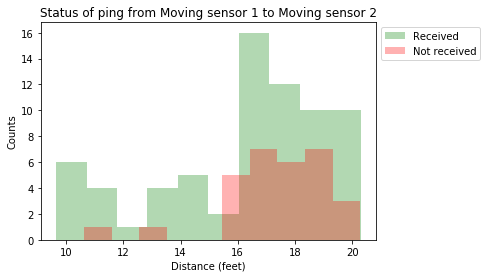

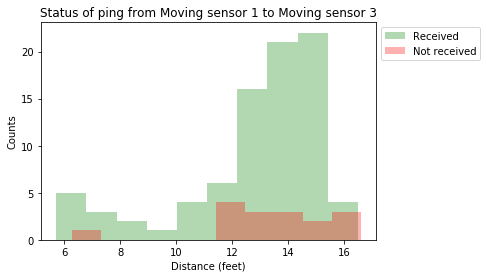

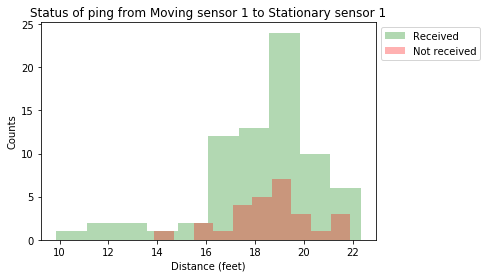

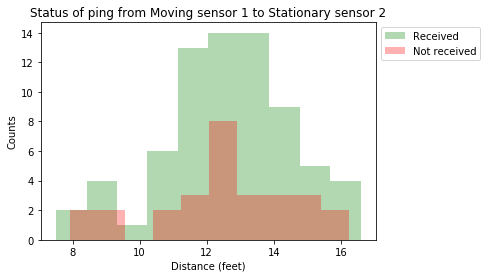

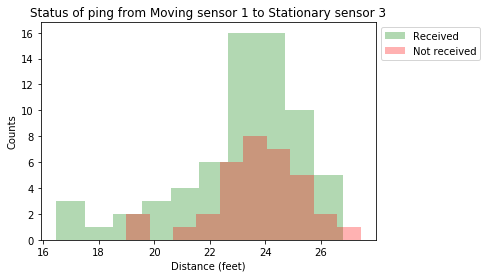

...

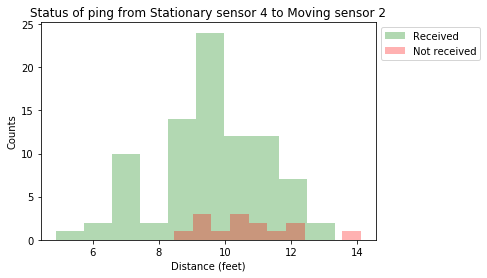

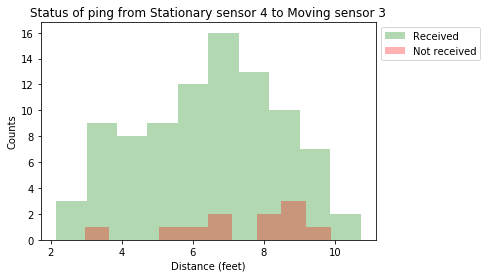

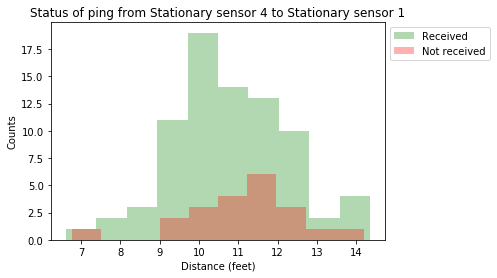

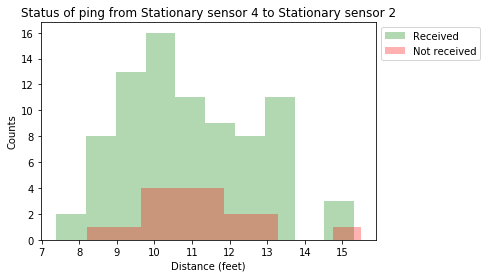

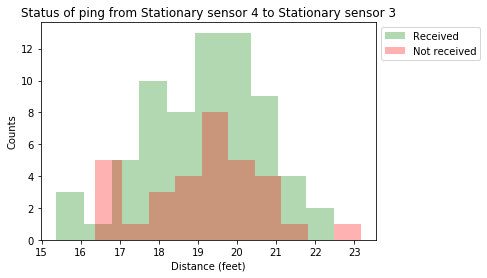

In [141]:
for y_discrete_var_index in range(num_y_discrete_vars):
    plt.hist(distances_fast_t[y_discrete_t[:,y_discrete_var_index] == 0, y_discrete_var_index],
            color='green',
            alpha=0.3,
            label=ping_status_names_long[0])
    plt.hist(distances_fast_t[y_discrete_t[:,y_discrete_var_index] == 1, y_discrete_var_index],
            color='red',
            alpha=0.3,
            label=ping_status_names_long[1])
    plt.title(y_discrete_names_long[y_discrete_var_index])
    plt.xlabel('Distance (feet)')
    plt.ylabel('Counts')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

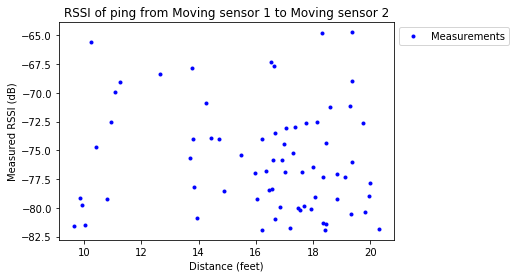

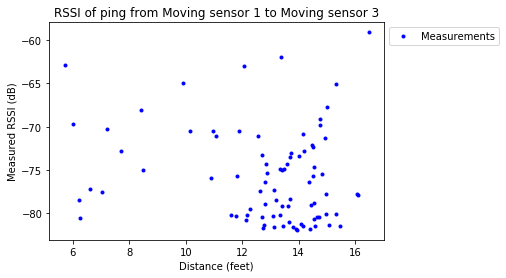

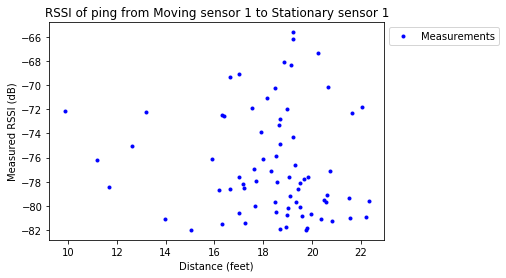

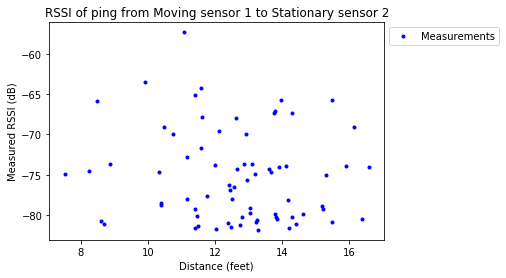

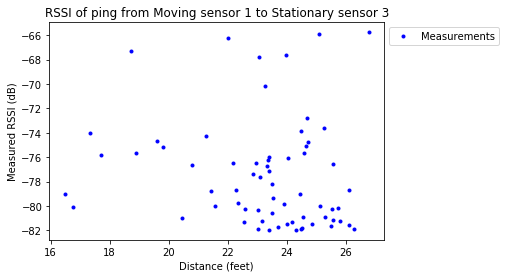

...

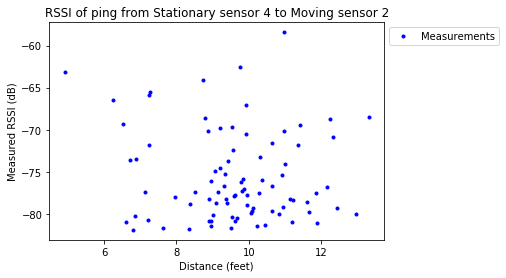

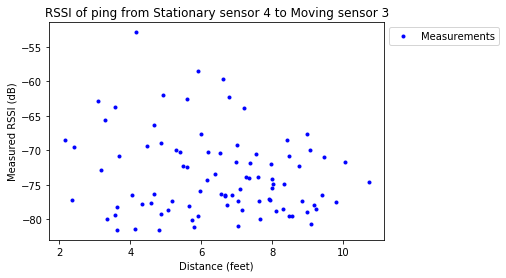

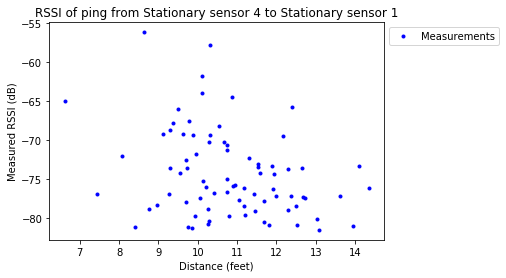

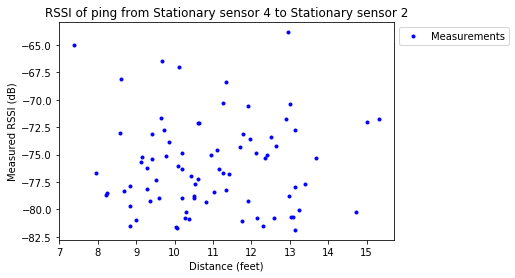

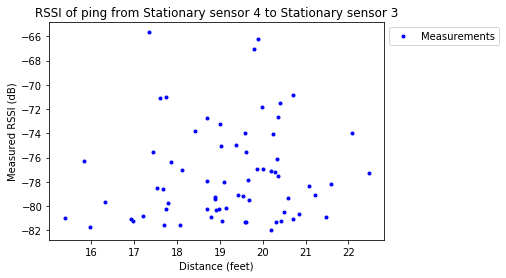

In [142]:
for y_continuous_var_index in range(num_y_continuous_vars):
    plt.plot(distances_fast_t[y_discrete_t[:,y_continuous_var_index] == 0, y_continuous_var_index],
             y_continuous_t[y_discrete_t[:,y_continuous_var_index] == 0, y_continuous_var_index],
             'b.',
            label='Measurements')
    plt.title(y_continuous_names_long[y_continuous_var_index])
    plt.xlabel('Distance (feet)')
    plt.ylabel('Measured RSSI (dB)')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

## Sample the posterior distribution $f(\mathbf{X}_t | \mathbf{Y}_0, \mathbf{Y}_1, \ldots, \mathbf{Y}_t)$ using a particle filter

Set the number of particles and initialize variables.

In [143]:
num_particles = 5000
particle_values = np.zeros((num_timesteps, num_particles, num_x_vars), dtype = 'float')
log_particle_weights = np.zeros((num_timesteps, num_particles), dtype = 'float')
sampled_particle_indices = np.zeros((num_timesteps, num_particles), dtype = 'int')

Generate the particles for the initial state $\mathbf{X}_0$.

In [144]:
time_start = time.clock()
for particle_index in range(num_particles):
    particle_values[0, particle_index] = x_initial_sample()
    log_particle_weights[0, particle_index] = log_f_y_bar_x_fast(particle_values[0, particle_index],
                                                                 y_discrete_t[0],
                                                                 y_continuous_t[0])
log_particle_weights[0] = log_particle_weights[0] - misc.logsumexp(log_particle_weights[0])
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 3.00356607848


Calculate the particles for all times $t>0$.

In [145]:
sys.stdout.write('t_index =')
sys.stdout.flush()
time_start = time.clock()
for t_index in range(1, num_timesteps):
    sys.stdout.write(' {}'.format(t_index))
    sys.stdout.flush()
    previous_particle_weights = np.exp(log_particle_weights[t_index - 1])
    for particle_index in range(num_particles):
        sampled_particle_indices[t_index - 1, particle_index] = np.random.choice(num_particles,
                                                                                 p=previous_particle_weights)
        previous_particle = particle_values[t_index - 1,
                                            sampled_particle_indices[t_index - 1, particle_index]]
        particle_values[t_index, particle_index] = x_bar_x_prev_sample_fast(previous_particle)
        log_particle_weights[t_index, particle_index] = log_f_y_bar_x_fast(particle_values[t_index, particle_index],
                                                                           y_discrete_t[t_index],
                                                                           y_continuous_t[t_index])
    log_particle_weights[t_index] = log_particle_weights[t_index]- misc.logsumexp(log_particle_weights[t_index])
print'\nTime elapsed = {}'.format(time.clock()-time_start)

t_index = 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99
Time elapsed = 554.190808665


Calculate and plot the maximum particle weight for each time step. If the maximum particle weight increases to 1.0 and stays there, then our particle filter has collapsed around a single value.

In [146]:
max_weights = np.max(np.exp(log_particle_weights), axis=1)

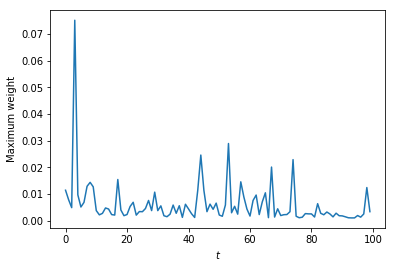

In [147]:
plt.plot(t, max_weights)
plt.xlabel('$t$')
plt.ylabel('Maximum weight')
plt.show()

Calculate and plot the number of particles actually sampled at each time step in the bootstrap process. If the number of particles actually sampled decreases to 1 and stays there, then our particle filter has collapsed around a single value.

In [148]:
num_sampled_particles = np.array([len(np.unique(sampled_particle_indices[t_index])) for t_index in range(num_timesteps)])

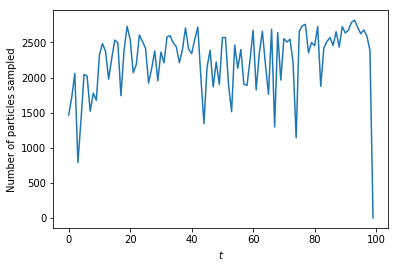

In [149]:
plt.plot(t, num_sampled_particles)
plt.xlabel('$t$')
plt.ylabel('Number of particles sampled')
plt.show()

Calculate the sample means and sample standard deviations of the particles at each time $t$.

In [150]:
x_mean_particle = np.average(
    particle_values, 
    axis=1, 
    weights=np.repeat(np.exp(log_particle_weights), num_x_vars).reshape((num_timesteps, num_particles, num_x_vars))
)

In [151]:
x_squared_mean_particle = np.average(
    np.square(particle_values), 
    axis=1,
    weights=np.repeat(np.exp(log_particle_weights), num_x_vars).reshape((num_timesteps, num_particles, num_x_vars))
)

In [152]:
x_sd_particle = np.sqrt(np.abs(x_squared_mean_particle - np.square(x_mean_particle)))

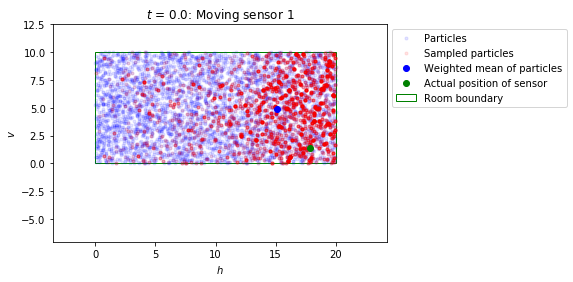

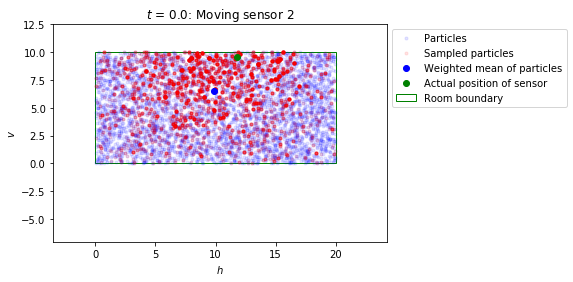

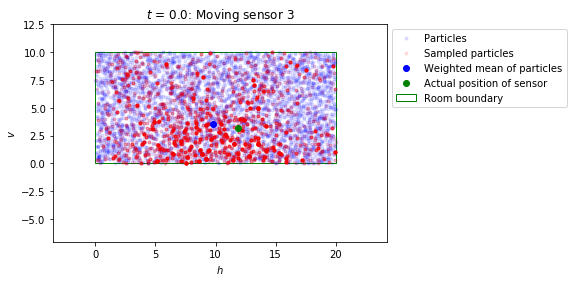

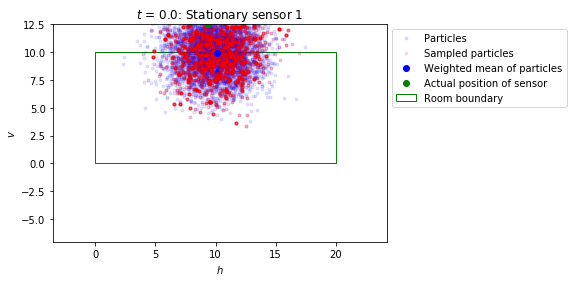

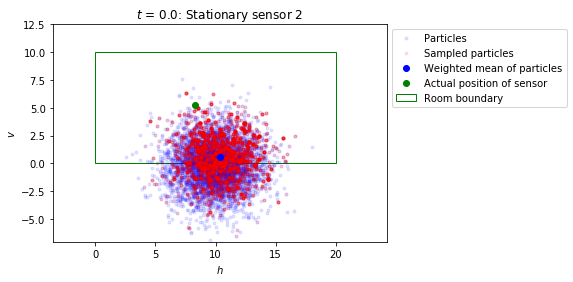

...

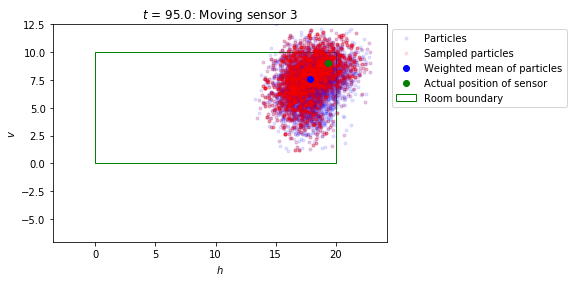

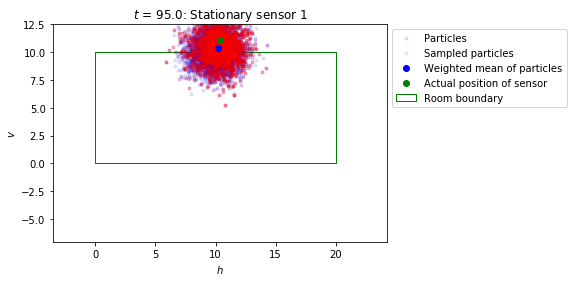

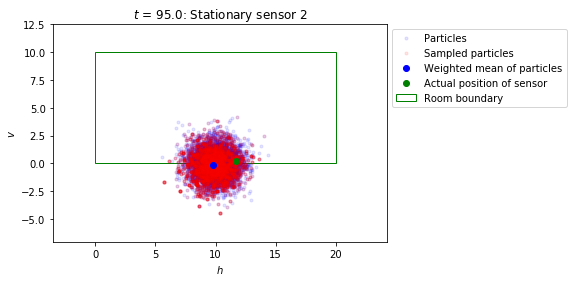

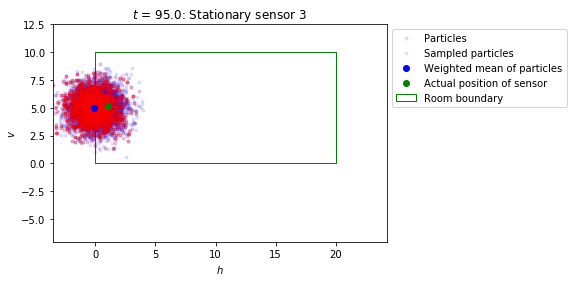

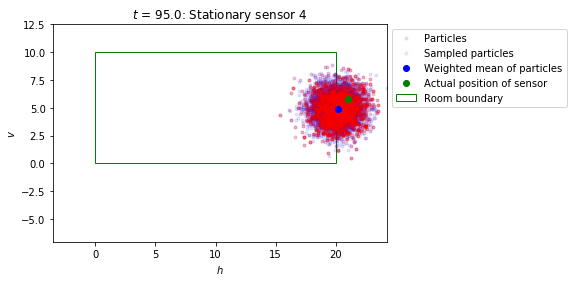

In [153]:
for t_index in [0, 50, 95]:
    for sensor_index in range(num_sensors):
        plt.plot(particle_values[t_index, :, sensor_index*2],
                 particle_values[t_index, :, sensor_index*2 + 1],
                'b.',
                alpha=0.1,
                label='Particles')
        plt.plot(particle_values[t_index, sampled_particle_indices[t_index], sensor_index*2],
                 particle_values[t_index, sampled_particle_indices[t_index], sensor_index*2 + 1],
                'r.',
                alpha=0.1,
                label='Sampled particles')
        plt.plot(x_mean_particle[t_index, sensor_index*2],
                 x_mean_particle[t_index, sensor_index*2 + 1],
                 'bo',
                 label = 'Weighted mean of particles')
        plt.plot(x_t[t_index, sensor_index*2],
                 x_t[t_index, sensor_index*2 + 1],
                 'go',
                 label = 'Actual position of sensor')
        plt.title('$t$ = {}: {}'.format(t[t_index],
                                       sensor_names_long[sensor_index]))
        plt.xlabel(dimension_names_long[0])
        plt.ylabel(dimension_names_long[1])
        plt.xlim(np.min([0, h_v_min_max[0, 0]]),
                 np.max([room_size[0], h_v_min_max[0, 1]]))
        plt.ylim(np.min([0, h_v_min_max[1, 0]]),
                 np.max([room_size[1], h_v_min_max[1, 1]]))
        ax=plt.gca()
        ax.add_patch(patches.Rectangle((0,0),
                                       room_size[0],
                                       room_size[1],
                                       fill=False,
                                       color='green',
                                       label='Room boundary'))
        plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
        plt.show()

Plot the sample means of the particles against the actual values of $\mathbf{X}_t$.

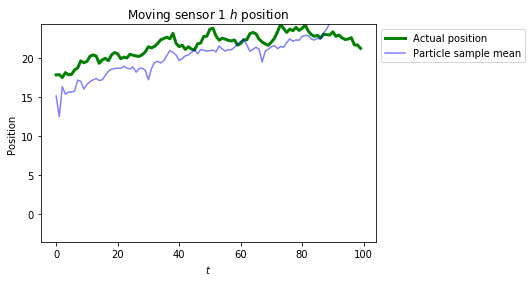

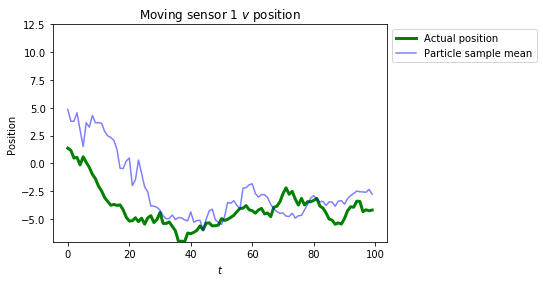

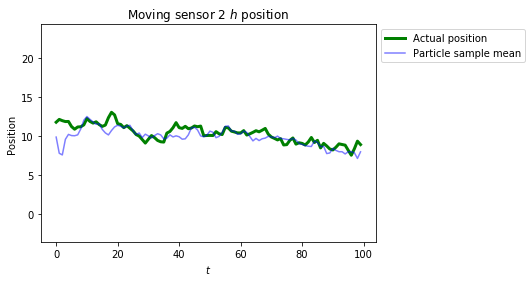

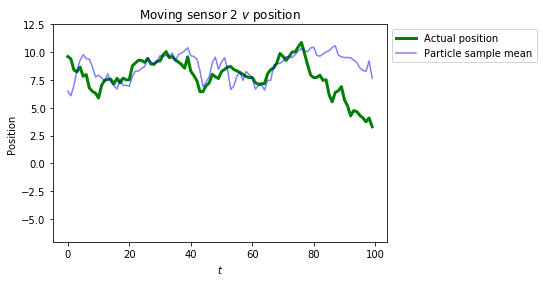

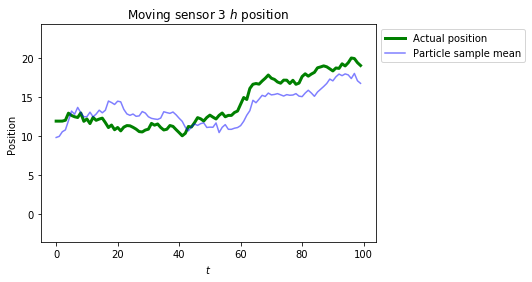

...

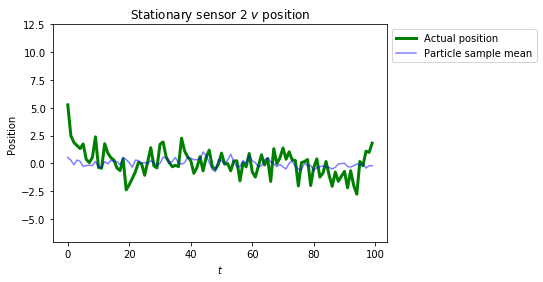

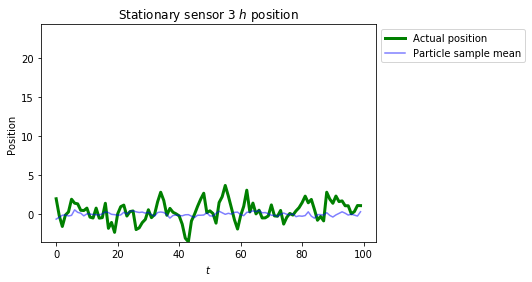

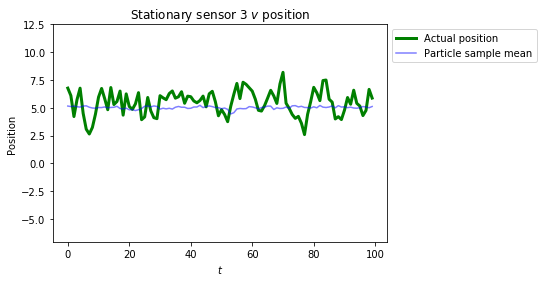

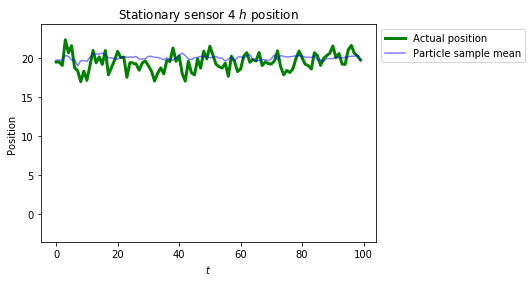

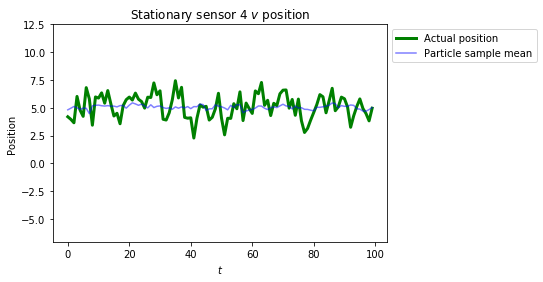

In [154]:
for x_var_index in range(num_x_vars):
    plt.plot(t, x_t[:,x_var_index], 'g-', linewidth=3.0, label='Actual position')
    plt.plot(t, x_mean_particle[:,x_var_index], 'b-', alpha=0.5, label='Particle sample mean')
    plt.xlabel('$t$')
    plt.ylabel('Position')
    plt.title(x_names_long[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.ylim(np.min([0, h_v_min_max[x_var_index % 2, 0]]),
             np.max([room_size[x_var_index % 2], h_v_min_max[x_var_index % 2, 1]]))
    plt.show()

Plot the sample confidence regions of the particles against the actual values of $\mathbf{X}_t$ (i.e., sample means plus/minus sample standard deviations)

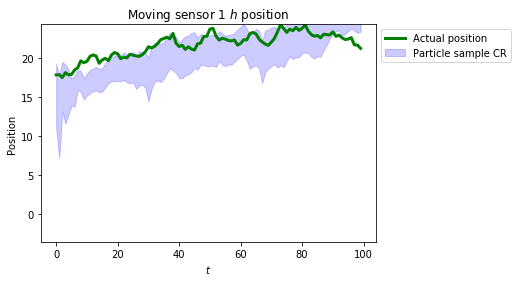

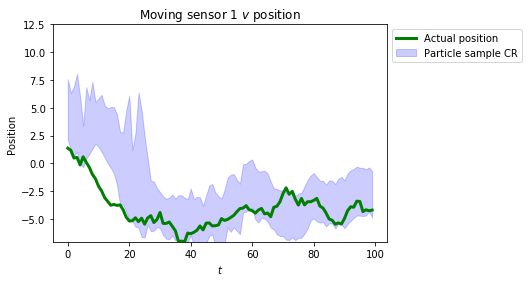

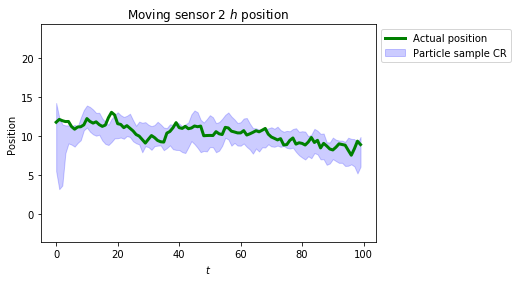

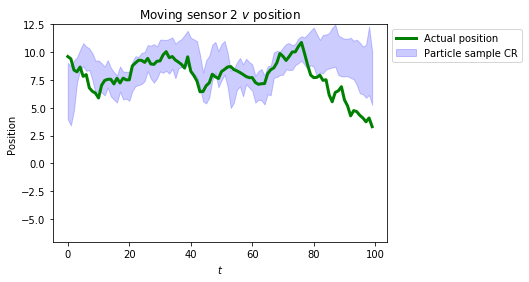

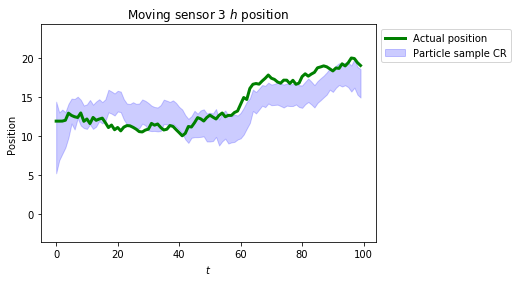

...

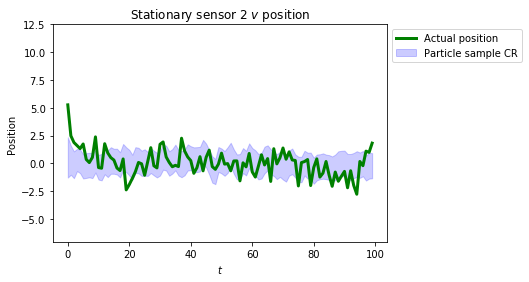

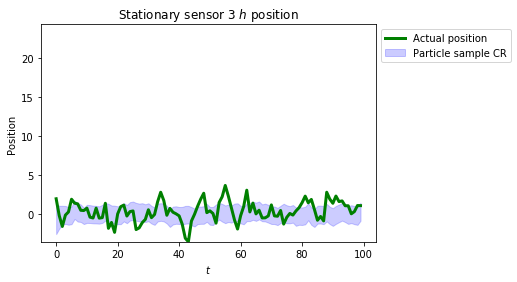

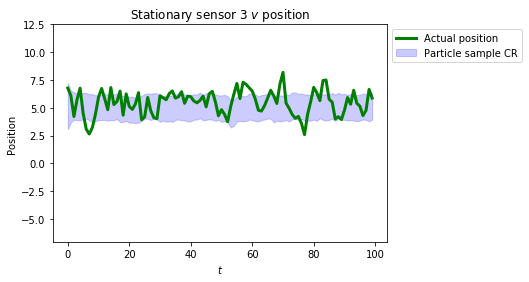

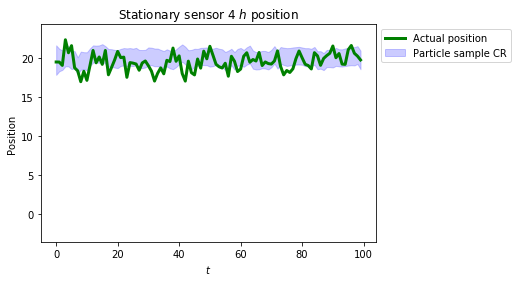

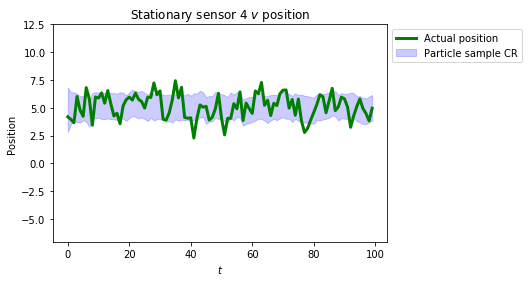

In [155]:
for x_var_index in range(num_x_vars):
    plt.plot(t, x_t[:,x_var_index], 'g-', linewidth=3.0, label='Actual position')
    plt.fill_between(
        t,
        x_mean_particle[:,x_var_index] - x_sd_particle[:, x_var_index],
        x_mean_particle[:,x_var_index] + x_sd_particle[:, x_var_index],
        color='blue',
        alpha=0.2,
        label='Particle sample CR'
    )
    plt.xlabel('$t$')
    plt.ylabel('Position')
    plt.title(x_names_long[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.ylim(np.min([0, h_v_min_max[x_var_index % 2, 0]]),
             np.max([room_size[x_var_index % 2], h_v_min_max[x_var_index % 2, 1]]))
    plt.show()